In this test we use the FoF parameters from MAGIC (ie 500km/s & 450kpc). The center is either the barycenter (weighted by Mstar) or the heaviest galaxy when there is one. Mvir and Rvir are computed from **5Rsigma^2/G (as Knoblel+09) but with R as the std** in projected space.

In [28]:
import numpy as np
import scipy as sc
import matplotlib.pyplot as plt
import pandas as pd
from astropy.table import Table
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy import constants as const
from astropy import units as u
from astropy.coordinates import SkyCoord, Distance
from astropy.cosmology import Planck15
from astropy.cosmology import WMAP9 as cosmo
from scipy.stats import binned_statistic
import matplotlib.backends.backend_pdf

import groups_tools as gid #the important homemade module

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Initial setups

In [29]:
plt.rcParams['text.usetex']=True
plt.rcParams['font.size']=16
plt.rcParams['lines.linewidth']=1.5
plt.rcParams['axes.linewidth']=2.0
plt.rcParams['image.interpolation']='none'
plt.rcParams['xtick.labelsize']='medium'
plt.rcParams['ytick.labelsize']='medium'
plt.rcParams['xtick.minor.visible']=True
plt.rcParams['ytick.minor.visible']=True
plt.rcParams['xtick.minor.size']=4.0
plt.rcParams['xtick.major.size']=8.0
plt.rcParams['ytick.minor.size']=4.0
plt.rcParams['ytick.major.size']=8.0
plt.rcParams['legend.numpoints']=1
plt.rcParams['image.origin']='lower'
plt.rcParams['font.family']='serif'
plt.rcParams['font.serif']='Computer Modern'

In [30]:
plt.rcParams['xtick.labelsize']='medium'
plt.rcParams['ytick.labelleft']= True
plt.rcParams['ytick.labelsize']='medium'
plt.rcParams['xtick.minor.visible']=False
plt.rcParams['ytick.minor.visible']=True
plt.rcParams['xtick.minor.size']=4.0
plt.rcParams['xtick.major.size']=8.0
plt.rcParams['ytick.minor.size']=4
plt.rcParams['ytick.major.size']=8
plt.rcParams['ytick.left']= True
plt.rcParams['ytick.major.left']= True

In [31]:
# wavelengths:
mgii_a = 2795.528
mgii_b = 2802.704
oii_a = 3726.04
oii_b = 3728.80

muse_min = 4800
muse_max = 9300

uves_min = 3000
uves_max = 11000

optical_min = 3700
optical_max = 7800

In [32]:
z_oii_a_muse_min = muse_min/oii_a -1
z_oii_a_muse_max = muse_max/oii_a -1

z_oii_b_muse_min = muse_min/oii_b -1
z_oii_b_muse_max = muse_max/oii_b -1

z_mgii_a_uves_min = uves_min/mgii_a -1
z_mgii_a_uves_max = uves_max/mgii_a -1

z_mgii_b_uves_min = uves_min/mgii_b -1
z_mgii_b_uves_max = uves_max/mgii_b -1

z_mgii_optical_min = optical_min/mgii_b -1
z_mgii_optical_max = optical_max/mgii_b -1

print("min z for oii in muse = ", z_oii_a_muse_min)
print("max z for oii in muse = ", z_oii_a_muse_max)

print("min z for mgii in uves = ", z_mgii_a_uves_min)
print("max z for mgii in uves = ", z_mgii_a_uves_max)

print("min z for mgii in optical = ", z_mgii_optical_min)
print("max z for mgii in optical = ", z_mgii_optical_max)

min z for oii in muse =  0.2882309368659488
max z for oii in muse =  1.4959474401777757
min z for mgii in uves =  0.07314253336042431
max z for mgii in uves =  2.934855955654889
min z for mgii in optical =  0.3201536801603022
max z for mgii in optical =  1.7830266770946914


# Data imports

In [33]:
megaflow_data = 'MEGAFLOW_master_dr2.v20230605.fits'
temp = Table.read(megaflow_data, format='fits')
data = temp.to_pandas()
primaries = pd.read_csv("primaries_ids.csv")
stellar_masses_v01 = pd.read_csv("mass_selectcat_v01b_reconmaster.tb.txt", sep = '|', skipinitialspace=True)
stellar_masses_v02 = pd.read_csv("mass_cat_master_v02psf.tb.txt", sep = "|", skipinitialspace = True)
Abs = pd.read_csv("MgII_all_absorption")
fields_info = pd.read_csv("fields_info_ebv.csv")
cov_table = pd.read_csv("group_abs_coverage_table.csv")

print("N of entries in megaflow: ", len(data))
print("N primaries: ", len(primaries))
print("N of entries in stellar_masses v01: ", len(stellar_masses_v01))
print("N of entries in stellar_masses v02: ", len(stellar_masses_v02))
print("N of entries in MgII_all_absorption: ", len(Abs))
print("N of entries in fields_info: ", len(fields_info))
print("N of entries in coverage table: ", len(cov_table))

N of entries in megaflow:  2463
N primaries:  200
N of entries in stellar_masses v01:  915
N of entries in stellar_masses v02:  21
N of entries in MgII_all_absorption:  126
N of entries in fields_info:  22
N of entries in coverage table:  1216


In [34]:
cov_table

,field_id,group_id,mean_z,bool_absorption,FeII_2374_lim,FeII_2600_lim,MgII_2796_lim,MgII_2803_lim,MgI_2852_lim
0,J1039p0714,11010.0,0.987764,1,inf,11.41,10.90,11.26,10.49
1,J0145p1056,7008.0,0.938645,1,inf,11.13,10.52,10.83,10.17
2,J1107p1021,12030.0,0.744453,1,11.97,inf,10.48,10.77,10.05
3,J0014m0028,7.0,0.831996,1,12.21,11.18,10.71,10.96,10.22
4,J0134p0051,6014.0,0.401240,1,12.94,11.64,10.62,10.97,10.30
...,...,...,...,...,...,...,...,...,...
1211,J1039p0714,-220011.0,1.532000,0,12.27,11.29,inf,inf,inf
1212,J1039p0714,-220016.0,1.185000,0,12.33,11.42,10.81,11.15,10.34
1213,J1039p0714,-220021.0,1.220700,0,12.29,inf,10.86,11.09,10.41
1214,J1039p0714,-220026.0,0.818490,1,inf,inf,10.93,11.22,10.51


In [35]:
np.round(8.434)

8.0

In [36]:
f1 = (np.round(cov_table["mean_z"],2) == 1.48)
f2 = cov_table["field_id"] == "J1358p1145"

cov_table[f1 & f2]

,field_id,group_id,mean_z,bool_absorption,FeII_2374_lim,FeII_2600_lim,MgII_2796_lim,MgII_2803_lim,MgI_2852_lim
24,J1358p1145,17015.0,1.48359,0,12.07,11.11,10.42,10.77,10.06


In [37]:
data = data.astype({'FIELD': 'string'})
data = data.rename(columns={"FIELD": "field_id"})
#data = data.rename(columns={"white_ID": "WHITE_ID"})
f1 = data["Z"].isnull() == False
f2 = data["Z"] != 0
f3 = data["ZCONF"] != 0
df = data[f1 & f2 & f3]

In [38]:
fields_list = df["field_id"].unique()
for f in fields_list:
    idx = df.index[df["field_id"] == f].tolist()
    df.loc[idx, "field_id"] = f[2:12]

/home/mcherrey/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [39]:
len(df)

2020

In [40]:
df.columns

Index(['ID', 'field_id', 'DATASET', 'FROM', 'Z', 'ZCONF', 'is_QSO', 'is_star',
       'DR1_id', 'DR1_nbmatch', 'RA', 'DEC', 'B_KPC', 'B_ARCSEC', 'REFSPEC',
       'REFCENTER', 'FELINE_ID', 'WHITE_ID', 'MANUAL_ID', 'fel_ID',
       'FEL_score', 'FEL_sigma', 'white_ID', 'wh_SDSS_r', 'wh_SDSS_i',
       'sp_F775W', 'sp_SDSS_r', 'sp_SDSS_i', 'SDSS_r', 'SDSS_r_ERR', 'SDSS_i',
       'SDSS_i_ERR', 'MAG_F775W', 'MAG_F775W_ERR', 'OII3726_FLUX',
       'OII3726_FLUX_ERR', 'OII3726_EQW', 'OII3726_FLUX_EQW', 'OII3729_FLUX',
       'OII3729_FLUX_ERR', 'OII3729_EQW', 'OII3729_EQW_ERR',
       'MGII2796_EMI_FLUX', 'MGII2796_EMI_FLUX_ERR', 'MGII2796_ABS_EQW',
       'MGII2796_ABS_EQW_ERR', 'MGII2803_EMI_FLUX', 'MGII2803_EMI_FLUX_ERR',
       'MGII2803_ABS_EQW', 'MGII2803_ABS_EQW_ERR', 'sed_logMass',
       'sed_logMass_l95', 'sed_logMass_u95', 'sed_rchisq', 'sed_ebv',
       'sed_ebv_l95', 'sed_ebv_u95', 'sed_age', 'sed_age_l95', 'sed_age_u95',
       'sed_metallicity', 'sed_tau', 'sed_tau_l95', 'sed

In [41]:
f1 = df["Z"] < z_oii_a_muse_max
f2 = df["Z"] > z_oii_a_muse_min
df_oii = df[f1 & f2]
N_z_oii_muse = len(df[f1 & f2])
N_z_mgii_uves = len(df[df["Z"] < z_mgii_a_uves_max])

print("Number of galaxies located at z compatible with [OII] in Muse: ", N_z_oii_muse)
print("Number of galaxies located at z compatible with MgII in Uves: ", N_z_mgii_uves)

Number of galaxies located at z compatible with [OII] in Muse:  1201
Number of galaxies located at z compatible with MgII in Uves:  1397


# Match the masses

In [42]:
len(df[~df["sed_logMass"].isna()])

1356

In [43]:
len(df[df["sed_logMass"].isna()])

664

For galaxies with no mass, we assign the median mass of the sample in a new column:

In [44]:
df["mass_noNA"] = df["sed_logMass"]
idx_nomass = ((df[df["sed_logMass"].isna()]).index).tolist()
df.loc[idx_nomass, "mass_noNA"] = df["sed_logMass"].median()
len(df[df["mass_noNA"].isna()])

<ipython-input-44-5b05900f86de>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mass_noNA"] = df["sed_logMass"]
/home/mcherrey/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


0

In [45]:
f1 = df["sed_logMass"].isna()
f2 = df["SDSS_r"].isna()
print("number of galaxies without mass: ", len(df[f1]))
print("number of galaxies without SDSS r: ", len(df[f2]))
print("number of galaxies without nor mass neither SDSS r: ", len(df[f1&f2]))
print("number of galaxies without mass but with SDSS r: ", len(df[f1&~f2]))
print("number of galaxies with mass but without SDSS r: ", len(df[~f1&f2]))

number of galaxies without mass:  664
number of galaxies without SDSS r:  222
number of galaxies without nor mass neither SDSS r:  0
number of galaxies without mass but with SDSS r:  664
number of galaxies with mass but without SDSS r:  222


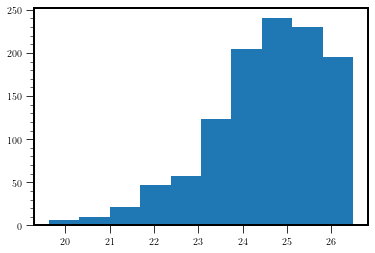

In [46]:
P = df[~f1]
plt.hist(P["SDSS_r"]);

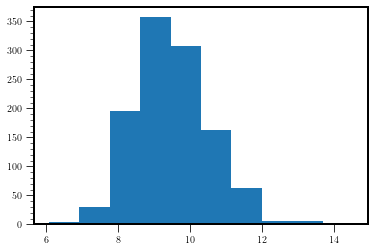

In [47]:
P = df[~f2]
plt.hist(P["sed_logMass"]);

/home/mcherrey/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


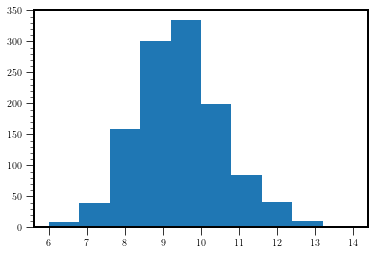

In [48]:
plt.hist(np.log10(10**df["sed_logMass_u95"] - 10**df["sed_logMass"]), range = (6,14));

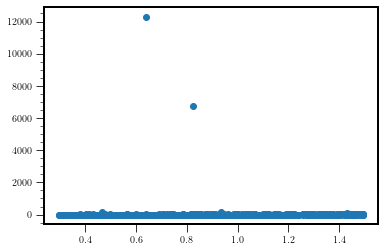

In [49]:
plt.scatter(df_oii["Z"], (10**df_oii["sed_logMass_u95"])/(10**df_oii["sed_logMass"]))
#plt.ylim((0,10))

(6.0, 14.0)

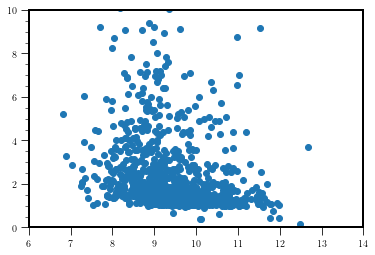

In [50]:
plt.scatter(df_oii["sed_logMass"], (10**df_oii["sed_logMass_u95"])/(10**df_oii["sed_logMass"]))
plt.ylim((0,10))
plt.xlim((6,14))

In [51]:
np.nanmedian((10**df_oii["sed_logMass_u95"])/(10**df_oii["sed_logMass"]))

1.7968959358543886

**So all the galaxies without mass do not have SDSS r. But some galaxies (370) with SDSS r have no mass.**

In [52]:
QSOs = df[df["is_QSO"] == 1]

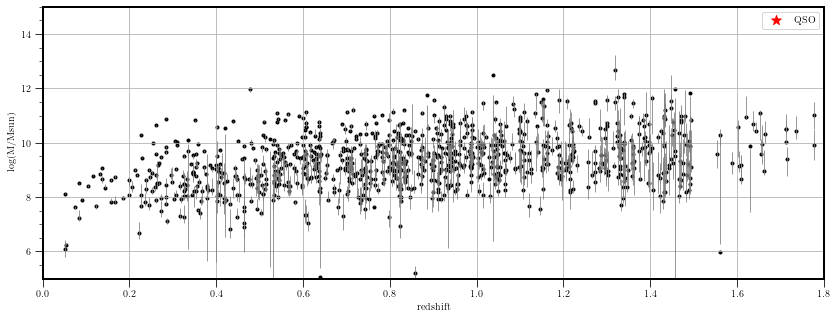

In [53]:
plt.figure(figsize=(14,5))
plt.vlines(df["Z"], df["sed_logMass_l95"], df["sed_logMass_u95"], color ="gray", linewidth = 0.8)
plt.scatter(df["Z"], df["sed_logMass"], marker = ".", c ="black")
plt.scatter(QSOs["Z"], QSOs["sed_logMass"], marker = "*", color = "red", s = 100, label = "QSO")
plt.ylim((5, 15))
plt.xlim((0,1.8))
plt.xlabel("redshift")
plt.ylabel("log(M/Msun)")
plt.grid()
plt.legend()

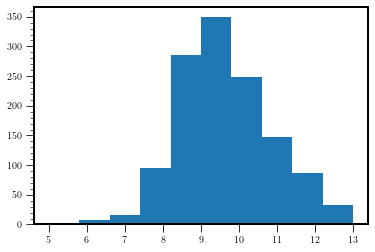

In [54]:
plt.hist(df["sed_logMass"], range = (5,13));


In [55]:
df["mass"] = df["sed_logMass"]

<ipython-input-55-e2deb8f15ab1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mass"] = df["sed_logMass"]


# Adding new fields

### Distances:

In [56]:
df["dist_ang"] = Distance(unit=u.m, z = df["Z"]).value/((1+df["Z"])**2)
df["dist_lum"] = Distance(unit=u.m, z = df["Z"]).value

<ipython-input-56-7b88e9c87834>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["dist_ang"] = Distance(unit=u.m, z = df["Z"]).value/((1+df["Z"])**2)
<ipython-input-56-7b88e9c87834>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["dist_lum"] = Distance(unit=u.m, z = df["Z"]).value


### Neighbours

In [57]:
df = gid.get_Nxxx_neighb(df, radius = 100)
df = gid.get_Nxxx_neighb(df, radius = 50)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

# Some theoretical calculations:

### Overdensities caracterisation

The number of galaxies that we expect to find in a cylinder of 100 kpc radius and +- 1000 km/s depth chosen at a 'random' place in the universe at redshift 1 is: 

In [58]:
z = [1]
M = [0]
d = np.array([z,M])
ref_sample = pd.DataFrame(d.T, columns = ["mean_z", "M_vel_disp"])
ref_sample = gid.get_all_expected_group_density(ref_sample, Radius = 100);
print("Nb of galaxies expected at a random place: ", round(float(ref_sample["N100_exp"].values),2), "+-", round(float(ref_sample["N100_exp_sigma"].values), 2))

R0 =  0
Z =  1       rz =  8319.340288578165
0.05227195666662151 0.05227195666662151 0.0 8319.340288578165
Nb of galaxies expected at a random place:  0.05 +- 0.23


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1081: RuntimeWarning: divide by zero encountered in log10
  logM = np.log10(M)


In [59]:
N_exp = float(ref_sample["N100_exp"].values)
N_exp_sigma = float(ref_sample["N100_exp_sigma"].values)
print("with 68% CL, we expect not more than: ", round(N_exp + N_exp_sigma, 2), "galaxies")
print("with 95% CL, we expect not more than: ", round(N_exp + 2*N_exp_sigma, 2), "galaxies")
print("with 99.7% CL, we expect not more than: ", round(N_exp + 3*N_exp_sigma, 2), "galaxies")

with 68% CL, we expect not more than:  0.28 galaxies
with 95% CL, we expect not more than:  0.51 galaxies
with 99.7% CL, we expect not more than:  0.74 galaxies


Now, if we pick a galaxy (let say of mass $1e11 M_{\odot}$), the probability to find another one in a 100 kpc radius is: 

In [60]:
z = [1]
M = [1e11]
d = np.array([z,M])
ref_sample2 = pd.DataFrame(d.T, columns = ["mean_z", "M_vel_disp"])
ref_sample2 = gid.get_all_expected_group_density(ref_sample2, Radius = 100, dv = 0.5e6);
print("Nb of galaxies expected at a random place: ", round(float(ref_sample2["N100_exp"].values),2), "+-", round(float(ref_sample2["N100_exp_sigma"].values), 2))


R0 =  2079.6
Z =  1.0       rz =  4159.670144289083
0.4319789415302203 0.026135978333310755 0.26746123561661245 4159.670144289083
Nb of galaxies expected at a random place:  0.43 +- 0.84


And for the whole Muse field, we can take a cylinder with the same area as the MUSE FOV:

In [61]:
angr = np.sqrt(3600/np.pi)*u.arcsec
#sep = 0.5*u.arcmin
#sep = 30*u.arcsec
sep = angr.to(u.radian)
rr = sep.value*Distance(unit=u.kpc, z = 1).value/((1+1)**2)
rr = int(np.round(rr))
print("radius: ", rr)

z = [1]
M = [1e11]
d = np.array([z,M])
ref_sample2 = pd.DataFrame(d.T, columns = ["mean_z", "M_vel_disp"])
ref_sample2 = gid.get_all_expected_group_density(ref_sample2, Radius = rr, dv = 0.5e6);
print("Nb of galaxies expected at a random place: ", round(float(ref_sample2["N279_exp"].values),2), "+-", round(float(ref_sample2["N279_exp_sigma"].values), 2))

radius:  279
R0 =  2079.6
Z =  1.0       rz =  4159.670144289083
1.5948579509629193 0.20344506894432426 2.6360777772187007 4159.670144289083
Nb of galaxies expected at a random place:  1.59 +- 2.06


### Nb of groups expected

According to Girelli 2020 Girelli 2020 (or  Hernandez-Aguayo 2018, or https://doi.org/10.1093/mnras/sty2270), we expect around 3e-4 halos of more than 1e13 Msun per Mpc3.h-3  
and approx 1e-3 halos ofr more than 1e12 Msun
![image.png](attachment:image.png)

In [62]:
Vmegaflow = gid.Vmegaflow(z_oii_a_muse_min, z_oii_b_muse_max) # in comoving Mpc3
Vmegaflow

<Quantity 1890.74700101 Mpc3>

In [63]:
z_oii_b_muse_min

0.2872774082814846

So we expect:

In [64]:
print("We expect ~", np.round(Vmegaflow.value*10**(-3.7), 2), "groups with halo mass above 1e13 Msun per field")
print("We expect ~", np.round(Vmegaflow.value*10**(-3), 2), "groups with halo mass above 1e12 Msun per field")
print("We expect ~", np.round(22*Vmegaflow.value*10**(-3.7), 1), "groups with halo mass above 1e13 Msun")
print("We expect ~", np.round(22*Vmegaflow.value*10**(-3), 1), "groups with halo mass above 1e12 Msun")

We expect ~ 0.38 groups with halo mass above 1e13 Msun per field
We expect ~ 1.89 groups with halo mass above 1e12 Msun per field
We expect ~ 8.3 groups with halo mass above 1e13 Msun
We expect ~ 41.6 groups with halo mass above 1e12 Msun


# I. FoF algorithm

In [300]:
R_fof = gid.FoF(df, D0 = 450, V0 = 500) #Using the parameters of Huchra & Geller, tested on TNG100 at z = 1

iter:  1       nb of ungrouped =  2020
Number of companions found:  1
         ID  group_id
2462  32081    -32081
iter:  2       nb of ungrouped =  2019
Number of companions found:  2
         ID  group_id
2461  32080    -32080
2457  32076    -32076
Number of companions found:  3
         ID  group_id
2461  32080         2
2457  32076         2
2432  32051    -32051
Number of companions found:  2
         ID  group_id
2457  32076         2
2432  32051         2
iter:  3       nb of ungrouped =  2016
Number of companions found:  2
         ID  group_id
2460  32079    -32079
2434  32053    -32053
Number of companions found:  2
         ID  group_id
2460  32079         3
2434  32053         3
iter:  4       nb of ungrouped =  2014
Number of companions found:  1
         ID  group_id
2459  32078    -32078
iter:  5       nb of ungrouped =  2013
Number of companions found:  1
         ID  group_id
2458  32077    -32077
iter:  6       nb of ungrouped =  2012
Number of companions found:  2
   

Number of companions found:  6
         ID  group_id
2380  31132        50
2379  31131        50
2370  31122        50
2351  31103        50
2337  31089        50
2334  31086        50
Number of companions found:  6
         ID  group_id
2380  31132        50
2379  31131        50
2370  31122        50
2351  31103        50
2337  31089        50
2334  31086        50
Number of companions found:  6
         ID  group_id
2380  31132        50
2379  31131        50
2370  31122        50
2351  31103        50
2337  31089        50
2334  31086        50
Number of companions found:  6
         ID  group_id
2380  31132        50
2379  31131        50
2370  31122        50
2351  31103        50
2337  31089        50
2334  31086        50
Number of companions found:  6
         ID  group_id
2380  31132        50
2379  31131        50
2370  31122        50
2351  31103        50
2337  31089        50
2334  31086        50
iter:  51       nb of ungrouped =  1948
Number of companions found:  5
    

Number of companions found:  1
         ID  group_id
2290  31042    -31042
iter:  87       nb of ungrouped =  1888
Number of companions found:  1
         ID  group_id
2288  31040    -31040
iter:  88       nb of ungrouped =  1887
Number of companions found:  1
         ID  group_id
2286  31038    -31038
iter:  89       nb of ungrouped =  1886
Number of companions found:  1
         ID  group_id
2284  31036    -31036
iter:  90       nb of ungrouped =  1885
Number of companions found:  1
         ID  group_id
2280  31032    -31032
iter:  91       nb of ungrouped =  1884
Number of companions found:  1
         ID  group_id
2276  31028    -31028
iter:  92       nb of ungrouped =  1883
Number of companions found:  1
         ID  group_id
2272  31024    -31024
iter:  93       nb of ungrouped =  1882
Number of companions found:  1
         ID  group_id
2271  31023    -31023
iter:  94       nb of ungrouped =  1881
Number of companions found:  1
         ID  group_id
2270  31022    -31022
iter:

Number of companions found:  3
         ID  group_id
2222  30085       134
2201  30064       134
2197  30060       134
Number of companions found:  3
         ID  group_id
2222  30085       134
2201  30064       134
2197  30060       134
iter:  135       nb of ungrouped =  1822
Number of companions found:  3
         ID  group_id
2220  30083    -30083
2212  30075    -30075
2152  30015    -30015
Number of companions found:  3
         ID  group_id
2220  30083       135
2212  30075       135
2152  30015       135
Number of companions found:  3
         ID  group_id
2220  30083       135
2212  30075       135
2152  30015       135
iter:  136       nb of ungrouped =  1819
Number of companions found:  3
         ID  group_id
2218  30081    -30081
2155  30018    -30018
2142  30005    -30005
Number of companions found:  3
         ID  group_id
2218  30081       136
2155  30018       136
2142  30005       136
Number of companions found:  3
         ID  group_id
2218  30081       136
2155  3001

Number of companions found:  2
         ID  group_id
2132  29096    -29096
2113  29077    -29077
Number of companions found:  2
         ID  group_id
2132  29096       185
2113  29077       185
iter:  186       nb of ungrouped =  1753
Number of companions found:  1
         ID  group_id
2131  29095    -29095
iter:  187       nb of ungrouped =  1752
Number of companions found:  1
         ID  group_id
2130  29094    -29094
iter:  188       nb of ungrouped =  1751
Number of companions found:  4
         ID  group_id
2129  29093    -29093
2117  29081    -29081
2114  29078    -29078
2107  29071    -29071
Number of companions found:  4
         ID  group_id
2129  29093       188
2117  29081       188
2114  29078       188
2107  29071       188
Number of companions found:  4
         ID  group_id
2129  29093       188
2117  29081       188
2114  29078       188
2107  29071       188
Number of companions found:  4
         ID  group_id
2129  29093       188
2117  29081       188
2114  29078  

Number of companions found:  1
         ID  group_id
2050  29014    -29014
iter:  233       nb of ungrouped =  1687
Number of companions found:  1
         ID  group_id
2049  29013    -29013
iter:  234       nb of ungrouped =  1686
Number of companions found:  1
         ID  group_id
2048  29012    -29012
iter:  235       nb of ungrouped =  1685
Number of companions found:  1
         ID  group_id
2047  29011    -29011
iter:  236       nb of ungrouped =  1684
Number of companions found:  1
         ID  group_id
2046  29010    -29010
iter:  237       nb of ungrouped =  1683
Number of companions found:  1
         ID  group_id
2045  29009    -29009
iter:  238       nb of ungrouped =  1682
Number of companions found:  1
         ID  group_id
2044  29008    -29008
iter:  239       nb of ungrouped =  1681
Number of companions found:  1
         ID  group_id
2043  29007    -29007
iter:  240       nb of ungrouped =  1680
Number of companions found:  1
         ID  group_id
2042  29006    -290

Number of companions found:  1
         ID  group_id
2001  28074    -28074
iter:  266       nb of ungrouped =  1628
Number of companions found:  1
         ID  group_id
2000  28073    -28073
iter:  267       nb of ungrouped =  1627
Number of companions found:  2
         ID  group_id
1998  28071    -28071
1954  28026    -28026
Number of companions found:  2
         ID  group_id
1998  28071       267
1954  28026       267
iter:  268       nb of ungrouped =  1625
Number of companions found:  1
         ID  group_id
1997  28070    -28070
iter:  269       nb of ungrouped =  1624
Number of companions found:  1
         ID  group_id
1995  28068    -28068
iter:  270       nb of ungrouped =  1623
Number of companions found:  1
         ID  group_id
1990  28063    -28063
iter:  271       nb of ungrouped =  1622
Number of companions found:  1
         ID  group_id
1988  28061    -28061
iter:  272       nb of ungrouped =  1621
Number of companions found:  1
         ID  group_id
1987  28060    -

Number of companions found:  1
         ID  group_id
1921  27095    -27095
iter:  318       nb of ungrouped =  1560
Number of companions found:  4
         ID  group_id
1920  27094    -27094
1919  27093    -27093
1887  27061    -27061
1861  27035    -27035
Number of companions found:  4
         ID  group_id
1920  27094       318
1919  27093       318
1887  27061       318
1861  27035       318
Number of companions found:  4
         ID  group_id
1920  27094       318
1919  27093       318
1887  27061       318
1861  27035       318
Number of companions found:  4
         ID  group_id
1920  27094       318
1919  27093       318
1887  27061       318
1861  27035       318
iter:  319       nb of ungrouped =  1556
Number of companions found:  2
         ID  group_id
1917  27091    -27091
1892  27066    -27066
Number of companions found:  2
         ID  group_id
1917  27091       319
1892  27066       319
iter:  320       nb of ungrouped =  1554
Number of companions found:  1
         ID  

Number of companions found:  1
         ID  group_id
1831  27005    -27005
iter:  374       nb of ungrouped =  1489
Number of companions found:  1
         ID  group_id
1830  27004    -27004
iter:  375       nb of ungrouped =  1488
Number of companions found:  1
         ID  group_id
1829  27003    -27003
iter:  376       nb of ungrouped =  1487
Number of companions found:  1
         ID  group_id
1828  27002    -27002
iter:  377       nb of ungrouped =  1486
Number of companions found:  1
         ID  group_id
1827  27001    -27001
iter:  378       nb of ungrouped =  1485
Number of companions found:  5
         ID  group_id
1826  26096    -26096
1798  26068    -26068
1796  26066    -26066
1785  26055    -26055
1778  26048    -26048
Number of companions found:  4
         ID  group_id
1826  26096       378
1798  26068       378
1796  26066       378
1778  26048       378
Number of companions found:  5
         ID  group_id
1826  26096       378
1798  26068       378
1796  26066       3

Number of companions found:  1
         ID  group_id
1768  26038    -26038
iter:  412       nb of ungrouped =  1423
Number of companions found:  1
         ID  group_id
1766  26036    -26036
iter:  413       nb of ungrouped =  1422
Number of companions found:  1
         ID  group_id
1765  26035    -26035
iter:  414       nb of ungrouped =  1421
Number of companions found:  1
         ID  group_id
1764  26034    -26034
iter:  415       nb of ungrouped =  1420
Number of companions found:  1
         ID  group_id
1759  26029    -26029
iter:  416       nb of ungrouped =  1419
Number of companions found:  2
         ID  group_id
1758  26028    -26028
1747  26017    -26017
Number of companions found:  2
         ID  group_id
1758  26028       416
1747  26017       416
iter:  417       nb of ungrouped =  1417
Number of companions found:  1
         ID  group_id
1756  26026    -26026
iter:  418       nb of ungrouped =  1416
Number of companions found:  1
         ID  group_id
1754  26024    -

Number of companions found:  1
         ID  group_id
1691  25056    -25056
iter:  463       nb of ungrouped =  1355
Number of companions found:  1
         ID  group_id
1690  25055    -25055
iter:  464       nb of ungrouped =  1354
Number of companions found:  1
         ID  group_id
1689  25054    -25054
iter:  465       nb of ungrouped =  1353
Number of companions found:  1
         ID  group_id
1687  25052    -25052
iter:  466       nb of ungrouped =  1352
Number of companions found:  1
         ID  group_id
1685  25050    -25050
iter:  467       nb of ungrouped =  1351
Number of companions found:  1
         ID  group_id
1684  25049    -25049
iter:  468       nb of ungrouped =  1350
Number of companions found:  1
         ID  group_id
1683  25048    -25048
iter:  469       nb of ungrouped =  1349
Number of companions found:  1
         ID  group_id
1682  25047    -25047
iter:  470       nb of ungrouped =  1348
Number of companions found:  1
         ID  group_id
1679  25044    -250

Number of companions found:  1
         ID  group_id
1597  24022    -24022
iter:  522       nb of ungrouped =  1282
Number of companions found:  1
         ID  group_id
1596  24021    -24021
iter:  523       nb of ungrouped =  1281
Number of companions found:  1
         ID  group_id
1595  24020    -24020
iter:  524       nb of ungrouped =  1280
Number of companions found:  1
         ID  group_id
1594  24019    -24019
iter:  525       nb of ungrouped =  1279
Number of companions found:  1
         ID  group_id
1593  24018    -24018
iter:  526       nb of ungrouped =  1278
Number of companions found:  1
         ID  group_id
1592  24017    -24017
iter:  527       nb of ungrouped =  1277
Number of companions found:  1
         ID  group_id
1591  24016    -24016
iter:  528       nb of ungrouped =  1276
Number of companions found:  1
         ID  group_id
1590  24015    -24015
iter:  529       nb of ungrouped =  1275
Number of companions found:  1
         ID  group_id
1589  24014    -240

Number of companions found:  4
         ID  group_id
1568  23154    -23154
1557  23143    -23143
1499  23085    -23085
1448  23034    -23034
Number of companions found:  4
         ID  group_id
1568  23154       546
1557  23143       546
1499  23085       546
1448  23034       546
Number of companions found:  4
         ID  group_id
1568  23154       546
1557  23143       546
1499  23085       546
1448  23034       546
Number of companions found:  4
         ID  group_id
1568  23154       546
1557  23143       546
1499  23085       546
1448  23034       546
iter:  547       nb of ungrouped =  1234
Number of companions found:  4
         ID  group_id
1566  23152    -23152
1552  23138    -23138
1534  23120    -23120
1525  23111    -23111
Number of companions found:  4
         ID  group_id
1566  23152       547
1552  23138       547
1534  23120       547
1525  23111       547
Number of companions found:  4
         ID  group_id
1566  23152       547
1552  23138       547
1534  23120     

Number of companions found:  3
         ID  group_id
1517  23103       570
1513  23099       570
1512  23098       570
Number of companions found:  3
         ID  group_id
1517  23103       570
1513  23099       570
1512  23098       570
iter:  571       nb of ungrouped =  1183
Number of companions found:  1
         ID  group_id
1510  23096    -23096
iter:  572       nb of ungrouped =  1182
Number of companions found:  1
         ID  group_id
1506  23092    -23092
iter:  573       nb of ungrouped =  1181
Number of companions found:  1
         ID  group_id
1504  23090    -23090
iter:  574       nb of ungrouped =  1180
Number of companions found:  1
         ID  group_id
1503  23089    -23089
iter:  575       nb of ungrouped =  1179
Number of companions found:  1
         ID  group_id
1501  23087    -23087
iter:  576       nb of ungrouped =  1178
Number of companions found:  3
         ID  group_id
1500  23086    -23086
1487  23073    -23073
1477  23063    -23063
Number of companions f

Number of companions found:  17
         ID  group_id
1414  22100       605
1404  22090       605
1403  22089       605
1398  22084       605
1396  22082       605
1389  22075       605
1388  22074       605
1387  22073       605
1386  22072       605
1385  22071       605
1381  22067       605
1378  22064       605
1373  22059       605
1372  22058       605
1368  22054       605
1364  22050       605
1356  22042       605
Number of companions found:  21
         ID  group_id
1414  22100       605
1404  22090       605
1403  22089       605
1398  22084       605
1396  22082       605
1389  22075       605
1388  22074       605
1387  22073       605
1386  22072       605
1385  22071       605
1381  22067       605
1379  22065       605
1378  22064       605
1376  22062       605
1373  22059       605
1372  22058       605
1369  22055       605
1368  22054       605
1366  22052       605
1364  22050       605
1356  22042       605
Number of companions found:  21
         ID  group_id
14

Number of companions found:  3
         ID  group_id
1393  22079    -22079
1383  22069    -22069
1357  22043    -22043
Number of companions found:  3
         ID  group_id
1393  22079       620
1383  22069       620
1357  22043       620
Number of companions found:  3
         ID  group_id
1393  22079       620
1383  22069       620
1357  22043       620
iter:  621       nb of ungrouped =  1102
Number of companions found:  2
         ID  group_id
1392  22078    -22078
1391  22077    -22077
Number of companions found:  2
         ID  group_id
1392  22078       621
1391  22077       621
iter:  622       nb of ungrouped =  1100
Number of companions found:  1
         ID  group_id
1390  22076    -22076
iter:  623       nb of ungrouped =  1099
Number of companions found:  1
         ID  group_id
1384  22070    -22070
iter:  624       nb of ungrouped =  1098
Number of companions found:  1
         ID  group_id
1382  22068    -22068
iter:  625       nb of ungrouped =  1097
Number of companion

Number of companions found:  1
         ID  group_id
1309  21130    -21130
iter:  671       nb of ungrouped =  1036
Number of companions found:  1
         ID  group_id
1307  21128    -21128
iter:  672       nb of ungrouped =  1035
Number of companions found:  1
         ID  group_id
1306  21127    -21127
iter:  673       nb of ungrouped =  1034
Number of companions found:  1
         ID  group_id
1305  21126    -21126
iter:  674       nb of ungrouped =  1033
Number of companions found:  2
         ID  group_id
1304  21125    -21125
1237  21058    -21058
Number of companions found:  2
         ID  group_id
1304  21125       674
1237  21058       674
iter:  675       nb of ungrouped =  1031
Number of companions found:  1
         ID  group_id
1303  21124    -21124
iter:  676       nb of ungrouped =  1030
Number of companions found:  3
         ID  group_id
1302  21123    -21123
1277  21098    -21098
1268  21089    -21089
Number of companions found:  3
         ID  group_id
1302  21123  

Number of companions found:  1
         ID  group_id
1213  21034    -21034
iter:  723       nb of ungrouped =  967
Number of companions found:  1
         ID  group_id
1212  21033    -21033
iter:  724       nb of ungrouped =  966
Number of companions found:  1
         ID  group_id
1196  21017    -21017
iter:  725       nb of ungrouped =  965
Number of companions found:  1
         ID  group_id
1195  21016    -21016
iter:  726       nb of ungrouped =  964
Number of companions found:  1
         ID  group_id
1187  21008    -21008
iter:  727       nb of ungrouped =  963
Number of companions found:  1
         ID  group_id
1180  21001    -21001
iter:  728       nb of ungrouped =  962
Number of companions found:  1
         ID  group_id
1179  20103    -20103
iter:  729       nb of ungrouped =  961
Number of companions found:  1
         ID  group_id
1178  20102    -20102
iter:  730       nb of ungrouped =  960
Number of companions found:  1
         ID  group_id
1177  20101    -20101
iter:

Number of companions found:  2
         ID  group_id
1131  20055       763
1119  20043       763
iter:  764       nb of ungrouped =  903
Number of companions found:  1
         ID  group_id
1130  20054    -20054
iter:  765       nb of ungrouped =  902
Number of companions found:  1
         ID  group_id
1129  20053    -20053
iter:  766       nb of ungrouped =  901
Number of companions found:  1
         ID  group_id
1128  20052    -20052
iter:  767       nb of ungrouped =  900
Number of companions found:  1
         ID  group_id
1124  20048    -20048
iter:  768       nb of ungrouped =  899
Number of companions found:  1
         ID  group_id
1123  20047    -20047
iter:  769       nb of ungrouped =  898
Number of companions found:  1
         ID  group_id
1122  20046    -20046
iter:  770       nb of ungrouped =  897
Number of companions found:  1
         ID  group_id
1121  20045    -20045
iter:  771       nb of ungrouped =  896
Number of companions found:  1
         ID  group_id
1118 

Number of companions found:  1
         ID  group_id
1053  19083    -19083
iter:  815       nb of ungrouped =  834
Number of companions found:  2
         ID  group_id
1051  19081    -19081
1049  19079    -19079
Number of companions found:  2
         ID  group_id
1051  19081       815
1049  19079       815
iter:  816       nb of ungrouped =  832
Number of companions found:  3
         ID  group_id
1046  19076    -19076
1027  19057    -19057
1014  19044    -19044
Number of companions found:  3
         ID  group_id
1046  19076       816
1027  19057       816
1014  19044       816
Number of companions found:  3
         ID  group_id
1046  19076       816
1027  19057       816
1014  19044       816
iter:  817       nb of ungrouped =  829
Number of companions found:  3
         ID  group_id
1045  19075    -19075
1044  19074    -19074
1037  19067    -19067
Number of companions found:  3
         ID  group_id
1045  19075       817
1044  19074       817
1037  19067       817
Number of compan

Number of companions found:  16
        ID  group_id
969  18096       842
968  18095       842
957  18084       842
956  18083       842
951  18078       842
946  18073       842
945  18072       842
942  18069       842
939  18066       842
937  18064       842
935  18062       842
933  18060       842
921  18048       842
915  18042       842
888  18015       842
874  18001       842
Number of companions found:  16
        ID  group_id
969  18096       842
968  18095       842
957  18084       842
956  18083       842
951  18078       842
946  18073       842
945  18072       842
942  18069       842
939  18066       842
937  18064       842
935  18062       842
933  18060       842
921  18048       842
915  18042       842
888  18015       842
874  18001       842
Number of companions found:  12
        ID  group_id
969  18096       842
951  18078       842
941  18068       842
939  18066       842
935  18062       842
929  18056       842
928  18055       842
921  18048       842
8

Number of companions found:  1
        ID  group_id
923  18050    -18050
iter:  867       nb of ungrouped =  735
Number of companions found:  1
        ID  group_id
922  18049    -18049
iter:  868       nb of ungrouped =  734
Number of companions found:  1
        ID  group_id
920  18047    -18047
iter:  869       nb of ungrouped =  733
Number of companions found:  1
        ID  group_id
911  18038    -18038
iter:  870       nb of ungrouped =  732
Number of companions found:  1
        ID  group_id
910  18037    -18037
iter:  871       nb of ungrouped =  731
Number of companions found:  4
        ID  group_id
901  18028    -18028
891  18018    -18018
884  18011    -18011
882  18009    -18009
Number of companions found:  4
        ID  group_id
901  18028       871
891  18018       871
884  18011       871
882  18009       871
Number of companions found:  4
        ID  group_id
901  18028       871
891  18018       871
884  18011       871
882  18009       871
Number of companions found:

Number of companions found:  2
        ID  group_id
838  17069       908
830  17061       908
iter:  909       nb of ungrouped =  666
Number of companions found:  1
        ID  group_id
836  17067    -17067
iter:  910       nb of ungrouped =  665
Number of companions found:  1
        ID  group_id
835  17066    -17066
iter:  911       nb of ungrouped =  664
Number of companions found:  1
        ID  group_id
832  17063    -17063
iter:  912       nb of ungrouped =  663
Number of companions found:  3
        ID  group_id
831  17062    -17062
828  17059    -17059
826  17057    -17057
Number of companions found:  3
        ID  group_id
831  17062       912
828  17059       912
826  17057       912
Number of companions found:  3
        ID  group_id
831  17062       912
828  17059       912
826  17057       912
iter:  913       nb of ungrouped =  660
Number of companions found:  1
        ID  group_id
829  17060    -17060
iter:  914       nb of ungrouped =  659
Number of companions found:  

Number of companions found:  1
        ID  group_id
756  16099    -16099
iter:  958       nb of ungrouped =  598
Number of companions found:  6
        ID  group_id
754  16097    -16097
737  16080    -16080
731  16074    -16074
726  16069    -16069
723  16066    -16066
722  16065    -16065
Number of companions found:  6
        ID  group_id
754  16097       958
737  16080       958
731  16074       958
726  16069       958
723  16066       958
722  16065       958
Number of companions found:  6
        ID  group_id
754  16097       958
737  16080       958
731  16074       958
726  16069       958
723  16066       958
722  16065       958
Number of companions found:  6
        ID  group_id
754  16097       958
737  16080       958
731  16074       958
726  16069       958
723  16066       958
722  16065       958
Number of companions found:  6
        ID  group_id
754  16097       958
737  16080       958
731  16074       958
726  16069       958
723  16066       958
722  16065       9

Number of companions found:  3
        ID  group_id
657  15064      1008
640  15047      1008
617  15024    -15024
Number of companions found:  2
        ID  group_id
640  15047      1008
617  15024      1008
iter:  1009       nb of ungrouped =  529
Number of companions found:  4
        ID  group_id
656  15063    -15063
632  15039    -15039
630  15037    -15037
627  15034    -15034
Number of companions found:  4
        ID  group_id
656  15063      1009
632  15039      1009
630  15037      1009
627  15034      1009
Number of companions found:  4
        ID  group_id
656  15063      1009
632  15039      1009
630  15037      1009
627  15034      1009
Number of companions found:  4
        ID  group_id
656  15063      1009
632  15039      1009
630  15037      1009
627  15034      1009
iter:  1010       nb of ungrouped =  525
Number of companions found:  1
        ID  group_id
654  15061    -15061
iter:  1011       nb of ungrouped =  524
Number of companions found:  1
        ID  group_id

Number of companions found:  1
        ID  group_id
584  14139    -14139
iter:  1063       nb of ungrouped =  459
Number of companions found:  2
        ID  group_id
583  14138    -14138
525  14080    -14080
Number of companions found:  3
        ID  group_id
583  14138      1063
566  14121    -14121
525  14080      1063
Number of companions found:  2
        ID  group_id
566  14121      1063
525  14080      1063
iter:  1064       nb of ungrouped =  456
Number of companions found:  1
        ID  group_id
582  14137    -14137
iter:  1065       nb of ungrouped =  455
Number of companions found:  9
        ID  group_id
581  14136    -14136
578  14133    -14133
576  14131    -14131
553  14108    -14108
550  14105    -14105
549  14104    -14104
547  14102    -14102
546  14101    -14101
543  14098    -14098
Number of companions found:  9
        ID  group_id
581  14136      1065
578  14133      1065
576  14131      1065
553  14108      1065
550  14105      1065
549  14104      1065
547  1410

Number of companions found:  1
        ID  group_id
498  14053    -14053
iter:  1102       nb of ungrouped =  397
Number of companions found:  1
        ID  group_id
497  14052    -14052
iter:  1103       nb of ungrouped =  396
Number of companions found:  1
        ID  group_id
496  14051    -14051
iter:  1104       nb of ungrouped =  395
Number of companions found:  2
        ID  group_id
493  14048    -14048
488  14043    -14043
Number of companions found:  2
        ID  group_id
493  14048      1104
488  14043      1104
iter:  1105       nb of ungrouped =  393
Number of companions found:  1
        ID  group_id
492  14047    -14047
iter:  1106       nb of ungrouped =  392
Number of companions found:  1
        ID  group_id
491  14046    -14046
iter:  1107       nb of ungrouped =  391
Number of companions found:  1
        ID  group_id
490  14045    -14045
iter:  1108       nb of ungrouped =  390
Number of companions found:  1
        ID  group_id
489  14044    -14044
iter:  1109   

Number of companions found:  7
        ID  group_id
430  13116    -13116
429  13115    -13115
428  13114    -13114
427  13113    -13113
418  13104    -13104
406  13092    -13092
315  13001    -13001
Number of companions found:  7
        ID  group_id
430  13116      1153
429  13115      1153
428  13114      1153
427  13113      1153
418  13104      1153
406  13092      1153
315  13001      1153
Number of companions found:  7
        ID  group_id
430  13116      1153
429  13115      1153
428  13114      1153
427  13113      1153
418  13104      1153
406  13092      1153
315  13001      1153
Number of companions found:  7
        ID  group_id
430  13116      1153
429  13115      1153
428  13114      1153
427  13113      1153
418  13104      1153
406  13092      1153
315  13001      1153
Number of companions found:  7
        ID  group_id
430  13116      1153
429  13115      1153
428  13114      1153
427  13113      1153
418  13104      1153
406  13092      1153
315  13001      1153
Numbe

Number of companions found:  1
        ID  group_id
338  13024    -13024
iter:  1193       nb of ungrouped =  264
Number of companions found:  1
        ID  group_id
337  13023    -13023
iter:  1194       nb of ungrouped =  263
Number of companions found:  1
        ID  group_id
334  13020    -13020
iter:  1195       nb of ungrouped =  262
Number of companions found:  2
        ID  group_id
333  13019    -13019
331  13017    -13017
Number of companions found:  2
        ID  group_id
333  13019      1195
331  13017      1195
iter:  1196       nb of ungrouped =  260
Number of companions found:  1
        ID  group_id
332  13018    -13018
iter:  1197       nb of ungrouped =  259
Number of companions found:  1
        ID  group_id
329  13015    -13015
iter:  1198       nb of ungrouped =  258
Number of companions found:  1
        ID  group_id
327  13013    -13013
iter:  1199       nb of ungrouped =  257
Number of companions found:  1
        ID  group_id
325  13011    -13011
iter:  1200   

Number of companions found:  1
        ID  group_id
244  12059    -12059
iter:  1245       nb of ungrouped =  192
Number of companions found:  1
        ID  group_id
241  12056    -12056
iter:  1246       nb of ungrouped =  191
Number of companions found:  2
        ID  group_id
239  12054    -12054
198  12013    -12013
Number of companions found:  2
        ID  group_id
239  12054      1246
198  12013      1246
iter:  1247       nb of ungrouped =  189
Number of companions found:  1
        ID  group_id
238  12053    -12053
iter:  1248       nb of ungrouped =  188
Number of companions found:  1
        ID  group_id
234  12049    -12049
iter:  1249       nb of ungrouped =  187
Number of companions found:  1
        ID  group_id
231  12046    -12046
iter:  1250       nb of ungrouped =  186
Number of companions found:  1
        ID  group_id
230  12045    -12045
iter:  1251       nb of ungrouped =  185
Number of companions found:  1
        ID  group_id
228  12043    -12043
iter:  1252   

Number of companions found:  5
        ID  group_id
178  11179      1280
154  11155      1280
141  11142      1280
140  11141      1280
136  11137      1280
iter:  1281       nb of ungrouped =  132
Number of companions found:  4
        ID  group_id
176  11177    -11177
122  11123    -11123
108  11109    -11109
44   11045    -11045
Number of companions found:  4
        ID  group_id
176  11177      1281
122  11123      1281
108  11109      1281
44   11045      1281
Number of companions found:  4
        ID  group_id
176  11177      1281
122  11123      1281
108  11109      1281
44   11045      1281
Number of companions found:  4
        ID  group_id
176  11177      1281
122  11123      1281
108  11109      1281
44   11045      1281
iter:  1282       nb of ungrouped =  128
Number of companions found:  1
        ID  group_id
175  11176    -11176
iter:  1283       nb of ungrouped =  127
Number of companions found:  5
        ID  group_id
174  11175    -11175
168  11169    -11169
167  1116

Number of companions found:  3
        ID  group_id
117  11118    -11118
115  11116    -11116
46   11047    -11047
Number of companions found:  3
        ID  group_id
117  11118      1315
115  11116      1315
46   11047      1315
Number of companions found:  3
        ID  group_id
117  11118      1315
115  11116      1315
46   11047      1315
iter:  1316       nb of ungrouped =  62
Number of companions found:  1
        ID  group_id
116  11117    -11117
iter:  1317       nb of ungrouped =  61
Number of companions found:  1
        ID  group_id
109  11110    -11110
iter:  1318       nb of ungrouped =  60
Number of companions found:  2
        ID  group_id
105  11106    -11106
104  11105    -11105
Number of companions found:  2
        ID  group_id
105  11106      1318
104  11105      1318
iter:  1319       nb of ungrouped =  58
Number of companions found:  1
        ID  group_id
103  11104    -11104
iter:  1320       nb of ungrouped =  57
Number of companions found:  1
        ID  group

In [65]:
#R_fof.to_csv("R_real_fof_450_500_raw_new.csv", index = False)
#R_fof.to_csv("R_real_fof_630_400_raw_new.csv", index = False)
R_fof = pd.read_csv("R_real_fof_450_500_raw_new.csv", index_col = False)

In [66]:
G_fof = gid.get_groups(R_fof, N_min = 1)
G3_fof = gid.get_groups(R_fof, N_min = 3)
G5_fof = gid.get_groups(R_fof, N_min = 5)

#### then we can compute the mass from velocity

For that we assume that the system is virialiazed and we apply the virial theorem that state that $2 E_c = E_p$. If we assume that all the galaxies of the group have the same mass $m$ things can be simplified. The kinetic energy is equal to :
\begin{equation}
E_k = \sum_i \frac{1}{2} m (v_i - v_{center})^2
\end{equation}

But by definition: 
\begin{equation}
\sigma_v^2 = \frac{1}{N} \sum_i (v_i - v_{center})^2
\end{equation}

So: 
\begin{equation}
E_k = \frac{m}{2} N \sigma_v^2 =  \frac{M}{2}  \sigma_v^2 \\
\end{equation}

On the other hand, the potential energy is given by:
\begin{equation}
E_p = \sum_{i, j} \frac{-G m_i m_j}{r_{i,j}}
\end{equation}
 
 \begin{equation}
E_p \approx -G m^2 \sum_{i, j} \frac{1}{R} = \frac{-G m^2}{R} \sum_{i=1}^N i\\
E_p = \frac{-G m^2 N(N-1)}{2R}\\
E_p \approx \frac{-G M^2}{2R}
\end{equation}

So Finally:
\begin{equation}
M \sigma_v^2 = \frac{-G M^2}{2R}\\
M = \frac{2R\sigma_v^2}{G}
\end{equation}

In [67]:
R_fof, G_fof = gid.calc_mass(R_fof, G_fof, N_lim = 3)

/home/mcherrey/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0, 0.5, 'M from $\\sigma^3$ (Bryan+97)')

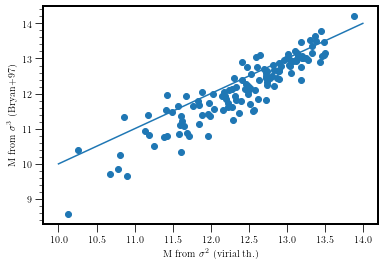

In [68]:
plt.scatter(np.log10(G_fof["Mvir_sigma2"]), np.log10(G_fof["Mvir_sigma3"]))
plt.plot([10,14], [10,14])
plt.xlabel("M from $\sigma^2$ (virial th.)")
plt.ylabel("M from $\sigma^3$ (Bryan+97)")

In [69]:
print("N of group of more than 3 galaxies: ", len(G3_fof))
print("N of group of more than 5 galaxies: ", len(G5_fof))

N of group of more than 3 galaxies:  131
N of group of more than 5 galaxies:  38


In [306]:
131-38

93

### Recompute the centers

For the centers we can just take the barycenters weighted by the stellar mass. With that method we don't have the drawback to choose arbitrarily a mass ratio threshold, so we don't have a sudden change of position under this value. In addition, we can estimate the error on the position of the center coming from the mass estimation.

To compute the error on the barycenter we need the error on the stellar mass. We have the 95% (2 sigma) lower and upper values in the catalogs, we could take the max of the diff between the bound and the central value, or the mean. Here we take the diff between the upper value and the central value:

R_fof["mass10_err_sup"] = 10**R_fof["mass"] - 10**R_fof["mass_l68"]
R_fof["mass10_err_inf"] = 10**R_fof["mass_u68"] - 10**R_fof["mass"]

R_fof["mass10_ratio_sup"] = (10**R_fof["mass"])/(10**R_fof["mass_l68"])
R_fof["mass10_ratio_inf"] = (10**R_fof["mass_u68"])/(10**R_fof["mass"])


plt.scatter(R_fof["Z"], R_fof["mass10_ratio_sup"])
plt.ylim((0,10))

np.nanmedian(R_fof["mass10_ratio_sup"])
np.nanmedian(R_fof["mass10_ratio_inf"])

In [70]:
#R_fof["mass10_err"] = np.max(10**R_fof["mass"] - 10**R_fof["mass_l68"], 10**R_fof["mass_u68"] - 10**R_fof["mass"])
#logM_2sigma_err =  R_fof["sed_logMass_u95"] -R_fof["mass"]
#logM_1sigma_err = logM_2sigma_err/2
#M_1sigma_err =  10**(R_fof["mass"] + logM_1sigma_err) - 10**R_fof["mass"]
#R_fof["mass10_err"] = M_1sigma_err
#R_fof["mass10_err"] = (10**R_fof["mass"] - 10**R_fof["sed_logMass_l95"]) + (10**R_fof["sed_logMass_u95"] - 10**R_fof["mass"])

In [71]:
#R_fof["mass10_err"] = np.max(10**R_fof["mass"] - 10**R_fof["mass_l68"], 10**R_fof["mass_u68"] - 10**R_fof["mass"])
sigma2_err =  10**R_fof["sed_logMass_u95"] - 10**R_fof["mass"]
sigma1_err = sigma2_err/2
#M_1sigma_err =  10**(R_fof["mass"] + logM_1sigma_err) - 10**R_fof["mass"]
R_fof["mass10_err"] = sigma1_err
#R_fof["mass10_err"] = (10**R_fof["mass"] - 10**R_fof["sed_logMass_l95"]) + (10**R_fof["sed_logMass_u95"] - 10**R_fof["mass"])

In [72]:
G_fof = gid.calc_mass_ratio(G_fof, R_fof)
G_fof = gid.recompute_centers_new(G_fof, R_fof)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:228: RuntimeWarning: invalid value encountered in double_scalars
  center_ra = (r["mass10"] * r["RA"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:229: RuntimeWarning: invalid value encountered in double_scalars
  center_dec = (r["mass10"] * r["DEC"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:230: RuntimeWarning: invalid value encountered in double_scalars
  center_z = (r["mass10"] * r["Z"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:228: RuntimeWarning: invalid value encountered in double_scalars
  center_ra = (r["mass10"] * r["RA"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:229: RuntimeWarning: invalid value encountered in double_scalars
  center_dec = (r["mass10"] * r["DEC"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_group

### Match with QSO

In [73]:
R_fof = gid.match_qso(R_fof, fields_info)
G_fof = gid.match_qso(G_fof, fields_info)
len(G_fof["group_id"])

1362

In [74]:
f1 = G_fof["Mvir_sigma2"]>=1e12
f2 = G_fof["Mvir_sigma2"]>=1e13
f3 = G_fof["mean_z"]>=0.3
f4 = G_fof["mean_z"]<=1.5
print("Number of groups with mass above 1e12 Msun: ", len(G_fof[f1 & f3 & f4]))
print("Number of groups with mass above 1e13 Msun: ", len(G_fof[f2 & f3 & f4]))

Number of groups with mass above 1e12 Msun:  77
Number of groups with mass above 1e13 Msun:  27


### Check for the group completely outside of the trend

In [75]:
G5_fof[G5_fof["field_id"] == "J0131p1303"]

,field_id,group_id,N_gal,mean_z,mean_ra,mean_dec,b_min_kpc,Mvir_sigma2,Mvir_sigma3,Rvir_sigma2,Rvir_sigma3,Mstar
16,J0131p1303,948,6,1.33906,22.8969,13.0605,71.00,NaN,NaN,NaN,NaN,1.119316e+12
17,J0131p1303,958,6,0.835952,22.9031,13.0606,96.06,NaN,NaN,NaN,NaN,6.118347e+09


In [76]:
gg = G5_fof[G5_fof["group_id"] == 979]
rr = R_fof[R_fof["group_id"] == 979]

In [77]:
rrr = rr.sort_values(by = ["mass10"], ascending = False)
rrr[["ID", "mass10"]]

,ID,mass10
1457,16045,1.788617e+09


In [78]:
2.137947/1.633728

1.3086309348924667

# II. Refinement with Halo occupation method (Hom)

In [318]:
G_hom = G_fof.copy()
R_hom = R_fof.copy()

0
------------- GROUP ID:  605
 M* ====  11.141338586807251
closest match =  11.141337590202054
11.141337590202054 11.141338586807251 11.141389944966697
slope =  2.292077919373132


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.195831931102033
closest match =  11.195841970146413
11.195792426642681 11.195831931102033 11.195841970146413
slope =  2.422137938846364


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.237199553738957
closest match =  11.237191584426256
11.237191584426256 11.237199553738957 11.237239653610525
slope =  2.4964268031431294
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.335896936975484
closest match =  11.335891248799692
11.335891248799692 11.335896936975484 11.335937344524549
slope =  2.603304327778794
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.34431686906824
closest match =  11.34431754044701
11.34427154421881 11.34431686906824 11.34431754044701
slope =  2.6089356607753973
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.351440280735194
closest match =  11.351440753981427
11.35139483636635 11.351440280735194 11.351440753981427
slope =  2.6134022816614544
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.368806653156094
closest match =  11.368810158784072
11.368764412014995 11.368806653156094 11.368810158784072
slope =  2.623162300487247
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.370022237613098
closest match =  11.369999430111077
11.369999430111077 11.370022237613098 11.370045165774878
slope =  2.6237992420062017
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.372393986170463
closest match =  11.372377146639085
11.372377146639085 11.372393986170463 11.372422861288037
slope =  2.6250053924394465
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.42345442105586
closest match =  11.423454931405367
11.423409569045347 11.42345442105586 11.423454931405367
slope =  2.645391464685894
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.431108157185006
closest match =  11.431117779429295
11.431072456467414 11.431108157185006 11.431117779429295
slope =  2.6476910385026255
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.43167236407149
closest match =  11.431661637500023
11.431661637500023 11.43167236407149 11.431706957552969
slope =  2.6478609845080703
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.436107062780213
closest match =  11.436101957498833
11.436101957498833 11.436107062780213 11.436147256159552
slope =  2.6491114330470125
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.438018456992083
closest match =  11.438004318531547
11.438004318531547 11.438018456992083 11.43804960830774
slope =  2.6496311110399073
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.505328203403137
closest match =  11.505342825554159
11.505297763529969 11.505328203403137 11.505342825554159
slope =  2.663022848386569
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.507163584671417
closest match =  11.50714521897781
11.50714521897781 11.507163584671417 11.507190276638518
slope =  2.6632807412811217
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.509233504987456
closest match =  11.509217762969435
11.509217762969435 11.509233504987456 11.509262815829208
slope =  2.6635645464685536
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.514566516723901
closest match =  11.514578340751052
11.514533299762645 11.514566516723901 11.514578340751052
slope =  2.664266577058677
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.514566516723901
closest match =  11.514578340751052
11.514533299762645 11.514566516723901 11.514578340751052
slope =  2.664266577058677
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


1
------------- GROUP ID:  842
 M* ====  10.985515117645264
closest match =  10.98549956523652
10.98549956523652 10.985515117645264 10.985565878049966
slope =  1.809623114666613


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.028185039829967
closest match =  11.028178898672255
11.028178898672255 11.028185039829967 11.028240000060999
slope =  1.9639684544247296


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.scatter(r_core["r_to_gcenter"], r_core["vlos_to_gcenter"], marker = "s", facecolors = "none", edgecolors = "r",\


 M* ====  11.028185039829967
closest match =  11.028178898672255
11.028178898672255 11.028185039829967 11.028240000060999
slope =  1.9639684544247296
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.224225516641122
closest match =  11.224242662223585
11.224194828608047 11.224225516641122 11.224242662223585
slope =  2.508721087963543
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.335894041192935
closest match =  11.33588858976092
11.33588858976092 11.335894041192935 11.335934215437616
slope =  2.630124278671553
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.340739259667437
closest match =  11.340722081320102
11.340722081320102 11.340739259667437 11.340767653513327
slope =  2.633210989480974
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.341310933822948
closest match =  11.341314481468704
11.341268915172714 11.341310933822948 11.341314481468704
slope =  2.633551782189871
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.34649531761687
closest match =  11.346505880365154
11.346460368548648 11.34649531761687 11.346505880365154
slope =  2.6367042501265345
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.366374167238124
closest match =  11.36635272228572
11.36635272228572 11.366374167238124 11.366398048742088
slope =  2.647486912231275
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.368713923035113
closest match =  11.368709193768913
11.368709193768913 11.368713923035113 11.368754500528524
slope =  2.6486378862750812
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.375747817564271
closest match =  11.375727374008086
11.375727374008086 11.375747817564271 11.37577262469792
slope =  2.651919792898821
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.382773018521748
closest match =  11.382782353961097
11.382737155589993 11.382773018521748 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.382773018521748
closest match =  11.382782353961097
11.382737155589993 11.382773018521748 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.382773018521748
closest match =  11.382782353961097
11.382737155589993 11.382773018521748 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.382773018521748
closest match =  11.382782353961097
11.382737155589993 11.382773018521748 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.383148036991711
closest match =  11.38314392920934
11.38314392920934 11.383148036991711 11.383189124652475
slope =  2.6551614872255986
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.394963959108363
closest match =  11.3949744545673
11.394929339107053 11.394963959108363 11.3949744545673
slope =  2.659868686982387
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.405931285550938
closest match =  11.405929249133269
11.405929249133269 11.405931285550938 11.405974297811342
slope =  2.6638117952834732
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.405931285550938
closest match =  11.405929249133269
11.405929249133269 11.405931285550938 11.405974297811342
slope =  2.6638117952834732
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


2
------------- GROUP ID:  1274
 M* ====  11.193827390670776
closest match =  11.193803818028886
11.193803818028886 11.193827390670776 11.193851281828819
slope =  2.528267862731112


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.27047471326407
closest match =  11.270457415331473
11.270457415331473 11.27047471326407 11.27050292874797
slope =  2.636611558694967


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.2766681872404
closest match =  11.276685426142482
11.276640018638012 11.2766681872404 11.276685426142482
slope =  2.6427613984498453
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.387155981698932
closest match =  11.387147266393374
11.387147266393374 11.387155981698932 11.387191541765212
slope =  2.7103374863112957
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.38788336450794
closest match =  11.387899913659009
11.387855642289225 11.38788336450794 11.387899913659009
slope =  2.7105824960430422
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.410323907997531
closest match =  11.410315704637217
11.410315704637217 11.410323907997531 11.410359862782897
slope =  2.7175325902057175
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.425951435597746
closest match =  11.425935919530016
11.425935919530016 11.425951435597746 11.425980012722208
slope =  2.721535775619381
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.42883602978296
closest match =  11.42884571062454
11.42880162827707 11.42883602978296 11.42884571062454
slope =  2.722205302086346
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


END: Psat max =  0.34524747480937357
3
------------- GROUP ID:  544
 M* ====  10.705596446990967
closest match =  10.705549756534218
10.705549756534218 10.705596446990967 10.705657275697929
slope =  1.116091270334892


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.80750260204697
closest match =  10.807524055694683
10.807435025002322 10.80750260204697 10.807524055694683
slope =  1.3478632685931247


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.808901533703349
closest match =  10.808857611823523
10.808857611823523 10.808901533703349 10.808946388787609
slope =  1.3517155181780514
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.808901533703349
closest match =  10.808857611823523
10.808857611823523 10.808901533703349 10.808946388787609
slope =  1.3517155181780514
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.833600654469072
closest match =  10.833617598233781
10.833533176738294 10.833600654469072 10.833617598233781
slope =  1.4214531419955354
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.94866425207421
closest match =  10.948632245260292
10.948632245260292 10.94866425207421 10.948698339779035
slope =  1.8155998756751113
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.949131771647995
closest match =  10.949160744490033
10.94909471417917 10.949131771647995 10.949160744490033
slope =  1.8173653651217947
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.949131771647995
closest match =  10.949160744490033
10.94909471417917 10.949131771647995 10.949160744490033
slope =  1.8173653651217947
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


END: Psat max =  0.0005941485465218443
4
------------- GROUP ID:  1065
 M* ====  10.775380849838257
closest match =  10.775377118625542
10.775377118625542 10.775380849838257 10.775468699597358
slope =  1.310328965002066


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.85224499359774
closest match =  10.852277866819108
10.85219990636002 10.85224499359774 10.852277866819108
slope =  1.5392572262191997


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.051227984481345
closest match =  11.051224935216512
11.051224935216512 11.051227984481345 11.051276963774153
slope =  2.3064487168000585
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.05354065348879
closest match =  11.053562044417541
11.053510200915348 11.05354065348879 11.053562044417541
slope =  2.3146815885536873
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.056947292032302
closest match =  11.05692301024221
11.05692301024221 11.056947292032302 11.056974582309921
slope =  2.3268642374970607
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.057514449028423
closest match =  11.057490080144387
11.057490080144387 11.057514449028423 11.057541607679976
slope =  2.3288752050140697
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


END: Psat max =  0.0009481970424533026
5
------------- GROUP ID:  549
 M* ====  11.585887670516968
closest match =  11.58590167601199
11.585857380875671 11.585887670516968 11.58590167601199
slope =  2.7091281342963485


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.68942798538658
closest match =  11.689430869982752
11.689386631081245 11.68942798538658 11.689430869982752
slope =  2.712571875037959


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.68942798538658
closest match =  11.689430869982752
11.689386631081245 11.68942798538658 11.689430869982752
slope =  2.712571875037959
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.691442240186907
closest match =  11.691421606607175
11.691421606607175 11.691442240186907 11.691465844891153
slope =  2.7126097402538685
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.691442240186907
closest match =  11.691421606607175
11.691421606607175 11.691442240186907 11.691465844891153
slope =  2.7126097402538685
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.695144229635257
closest match =  11.695137576721686
11.695137576721686 11.695144229635257 11.69518181391049
slope =  2.712676895983753
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.695144229635257
closest match =  11.695137576721686
11.695137576721686 11.695144229635257 11.69518181391049
slope =  2.712676895983753
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.695144229635257
closest match =  11.695137576721686
11.695137576721686 11.695144229635257 11.69518181391049
slope =  2.712676895983753
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


6
------------- GROUP ID:  315
 M* ====  10.723617315292358
closest match =  10.723576155979679
10.723576155979679 10.723617315292358 10.723676368169508
slope =  1.1974710882499613


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.139077756185783
closest match =  11.139088955812108
11.139042781027115 11.139077756185783 11.139088955812108
slope =  2.5988469687890374


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


 M* ====  11.141280613577237
closest match =  11.141303125195956
11.141257040729101 11.141280613577237 11.141303125195956
slope =  2.6039402905816575
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


 M* ====  11.141280613577237
closest match =  11.141303125195956
11.141257040729101 11.141280613577237 11.141303125195956
slope =  2.6039402905816575
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


 M* ====  11.146698166797238
closest match =  11.146682368770037
11.146682368770037 11.146698166797238 11.146728239026332
slope =  2.616100490879567
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


 M* ====  11.146698166797238
closest match =  11.146682368770037
11.146682368770037 11.146698166797238 11.146728239026332
slope =  2.616100490879567
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


7
------------- GROUP ID:  437
 M* ====  9.81411498785019
closest match =  9.81408753451381
9.81408753451381 9.81411498785019 9.814303383809436
slope =  0.5559489998101663


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.236830275362667
closest match =  10.236746753771941
10.236746753771941 10.236830275362667 10.236933438240762
slope =  0.6428022682951915


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.236830275362667
closest match =  10.236746753771941
10.236746753771941 10.236830275362667 10.236933438240762
slope =  0.6428022682951915
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.236830275362667
closest match =  10.236746753771941
10.236746753771941 10.236830275362667 10.236933438240762
slope =  0.6428022682951915
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.236830275362667
closest match =  10.236746753771941
10.236746753771941 10.236830275362667 10.236933438240762
slope =  0.6428022682951915
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


8
------------- GROUP ID:  112
 M* ====  10.888729810714722
closest match =  10.888739456721382
10.88865762275437 10.888729810714722 10.888739456721382
slope =  1.4663984210020076


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.007512420749078
closest match =  11.007521986861162
11.007457598796778 11.007512420749078 11.007521986861162
slope =  1.8637180844137944


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.007512420749078
closest match =  11.007521986861162
11.007457598796778 11.007512420749078 11.007521986861162
slope =  1.8637180844137944
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


END: Psat max =  0.25502404831885106
9
------------- GROUP ID:  248
 M* ====  10.985125064849854
closest match =  10.985087546165442
10.985087546165442 10.985125064849854 10.985168811732564
slope =  1.4766549261065842


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.056789200855778
closest match =  11.056822953488473
11.056751887067039 11.056789200855778 11.056822953488473
slope =  1.6885780596823061


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.056789200855778
closest match =  11.056822953488473
11.056751887067039 11.056789200855778 11.056822953488473
slope =  1.6885780596823061
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.059180924361295
closest match =  11.059162991315247
11.059162991315247 11.059180924361295 11.059233745991078
slope =  1.6960179465397283
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.059180924361295
closest match =  11.059162991315247
11.059162991315247 11.059180924361295 11.059233745991078
slope =  1.6960179465397283
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


10
------------- GROUP ID:  247
 M* ====  10.95026159286499
closest match =  10.950239926501347
10.950239926501347 10.95026159286499 10.950315712590424
slope =  1.583419879198203


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


 M* ====  11.375672763055508
closest match =  11.375683623368856
11.37563699521063 11.375672763055508 11.375683623368856
slope =  2.573577953303758


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.385573550783864
closest match =  11.385558302784872
11.385558302784872 11.385573550783864 11.385604833525699
slope =  2.5789660314824348
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


 M* ====  11.385573550783864
closest match =  11.385558302784872
11.385558302784872 11.385573550783864 11.385604833525699
slope =  2.5789660314824348
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


 M* ====  11.385573550783864
closest match =  11.385558302784872
11.385558302784872 11.385573550783864 11.385604833525699
slope =  2.5789660314824348
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


11
------------- GROUP ID:  889
 M* ====  10.576167345046997
closest match =  10.576131722932507
10.576131722932507 10.576167345046997 10.57625345020276
slope =  0.9858201844497098
BREAK:  4 candidates kept
12
------------- GROUP ID:  1153
 M* ====  10.281065821647644
closest match =  10.280995324340646
10.280995324340646 10.281065821647644 10.281169678610539
slope =  0.6882607468419014


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.359913601076325
closest match =  10.359907767368643
10.359907767368643 10.359913601076325 10.360072707723404
slope =  0.7275429968830218


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.391002435006557
closest match =  10.391031156610099
10.390870209819168 10.391002435006557 10.391031156610099
slope =  0.7455954810845212
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.478734735783078
closest match =  10.478676135941493
10.478676135941493 10.478734735783078 10.478824819304117
slope =  0.8070923194990358
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.478734735783078
closest match =  10.478676135941493
10.478676135941493 10.478734735783078 10.478824819304117
slope =  0.8070923194990358
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


13
------------- GROUP ID:  13
 M* ====  10.978548884391785
closest match =  10.978570785151287
10.978489848534249 10.978548884391785 10.978570785151287
slope =  1.4826564835815113


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.30358110378497
closest match =  11.303570974008432
11.303570974008432 11.30358110378497 11.303622138050008
slope =  2.3454206570398766


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.30358110378497
closest match =  11.303570974008432
11.303570974008432 11.30358110378497 11.303622138050008
slope =  2.3454206570398766
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.304401060866939
closest match =  11.304389405265683
11.304389405265683 11.304401060866939 11.304440543551083
slope =  2.3466019455096196
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.304401060866939
closest match =  11.304389405265683
11.304389405265683 11.304401060866939 11.304440543551083
slope =  2.3466019455096196
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


14
------------- GROUP ID:  733
 M* ====  10.158390164375305
closest match =  10.158362069240368
10.158362069240368 10.158390164375305 10.158549981163974
slope =  0.6386034356461475


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.389238431793796
closest match =  10.389164677948264
10.389164677948264 10.389238431793796 10.389327192590892
slope =  0.7384023868289445


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.39409396607068
closest match =  10.394030942340141
10.394030942340141 10.39409396607068 10.394192823931835
slope =  0.7412899685127697
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


END: Psat max =  4.796129501816182e-05
15
------------- GROUP ID:  1144
 M* ====  9.866744697093964
closest match =  9.866673564251792
9.866673564251792 9.866744697093964 9.86687800888647
slope =  0.5869618452083527


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  9.87225330056611
closest match =  9.872189166687901
9.872189166687901 9.87225330056611 9.872393272178156
slope =  0.5879371488817363


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


END: Psat max =  0.2675325495065092
16
------------- GROUP ID:  948
 M* ====  11.78352975845337
closest match =  11.78351802146696
11.78351802146696 11.78352975845337 11.783565048616275
slope =  2.551743019965588


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  12.048952588627152
closest match =  12.048954392255013
12.048907397350565 12.048952588627152 12.048954392255013
slope =  2.5534938611165696


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


END: Psat max =  0.008736428486368242
17
------------- GROUP ID:  958
 M* ====  9.329996943473816
closest match =  9.329963808634982
9.329963808634982 9.329996943473816 9.330191620313185
slope =  0.5267561389228184


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  9.76114160046633
closest match =  9.761056904947246
9.761056904947246 9.76114160046633 9.761270457888557
slope =  0.5619271702598365


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  9.786634078119965
closest match =  9.78660980614885
9.78660980614885 9.786634078119965 9.78682211637734
slope =  0.5652162915763929
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  9.786634078119965
closest match =  9.78660980614885
9.78660980614885 9.786634078119965 9.78682211637734
slope =  0.5652162915763929
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


18
------------- GROUP ID:  667
 M* ====  9.66136908531189
closest match =  9.661266498897184
9.661266498897184 9.66136908531189 9.661484284080778
slope =  0.5510071807058494
BREAK:  2 candidates kept
19
------------- GROUP ID:  316
 M* ====  11.77310585975647
closest match =  11.773086646262154
11.773086646262154 11.77310585975647 11.773132459900086
slope =  2.619333574663454


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


 M* ====  11.80928702244475
closest match =  11.809276433818372
11.809276433818372 11.80928702244475 11.809322240308902
slope =  2.619742281629825


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.80928702244475
closest match =  11.809276433818372
11.809276433818372 11.80928702244475 11.809322240308902
slope =  2.619742281629825
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.80928702244475
closest match =  11.809276433818372
11.809276433818372 11.80928702244475 11.809322240308902
slope =  2.619742281629825
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


20
------------- GROUP ID:  192
 M* ====  10.661935567855835
closest match =  10.661934948321212
10.661934948321212 10.661935567855835 10.662037058318761
slope =  1.1752149925778124


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.704506654183435
closest match =  10.704536556672135
10.704442688957059 10.704506654183435 10.704536556672135
slope =  1.2784075964129793


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.706435526021407
closest match =  10.70641008877266
10.70641008877266 10.706435526021407 10.706503574550053
slope =  1.283630551703605
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.706435526021407
closest match =  10.70641008877266
10.70641008877266 10.706435526021407 10.706503574550053
slope =  1.283630551703605
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


21
------------- GROUP ID:  50
 M* ====  10.686725854873657
closest match =  10.686729324768876
10.686605184484552 10.686725854873657 10.686729324768876
slope =  0.9666580084221941


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.735748480480693
closest match =  10.735762715928988
10.735647000150557 10.735748480480693 10.735762715928988
slope =  1.0370340297439078


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.746766448610444
closest match =  10.746778196031379
10.746664398544048 10.746766448610444 10.746778196031379
slope =  1.0545153748879887
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.746766448610444
closest match =  10.746778196031379
10.746664398544048 10.746766448610444 10.746778196031379
slope =  1.0545153748879887
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


22
------------- GROUP ID:  741
 M* ====  10.697511553764343
closest match =  10.697502469694829
10.697502469694829 10.697511553764343 10.697613694451594
slope =  1.0789072819946102


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.802161032712462
closest match =  10.802146881611627
10.802146881611627 10.802161032712462 10.802239231589724
slope =  1.2994177419931998


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


END: Psat max =  0.32771312925861795
23
------------- GROUP ID:  796
 M* ====  11.133873224258423
closest match =  11.13387536588527
11.133828976942386 11.133873224258423 11.13387536588527
slope =  2.5868492047933236


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.25770723559561
closest match =  11.257702734194293
11.257702734194293 11.25770723559561 11.257745910633133
slope =  2.779321389974366


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.25770723559561
closest match =  11.257702734194293
11.257702734194293 11.25770723559561 11.257745910633133
slope =  2.779321389974366
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


24
------------- GROUP ID:  1280
 M* ====  10.008962273597717
closest match =  10.008975636705769
10.00876988502678 10.008962273597717 10.008975636705769
slope =  0.5832331507641362


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.294487481749004
closest match =  10.294432538615828
10.294432538615828 10.294487481749004 10.294614637975618
slope =  0.6589874898599849


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.294487481749004
closest match =  10.294432538615828
10.294432538615828 10.294487481749004 10.294614637975618
slope =  0.6589874898599849
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


25
------------- GROUP ID:  1054
 M* ====  10.49798059463501
closest match =  10.498011482870918
10.497860497694798 10.49798059463501 10.498011482870918
slope =  0.794787959291165
BREAK:  2 candidates kept
26
------------- GROUP ID:  1140
 M* ====  10.115768790245056
closest match =  10.115752159089492
10.115752159089492 10.115768790245056 10.115938398425476
slope =  0.644338637591026


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.300866537054619
closest match =  10.300786034534651
10.300786034534651 10.300866537054619 10.300952301720486
slope =  0.7217371209328459


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.300866537054619
closest match =  10.300786034534651
10.300786034534651 10.300866537054619 10.300952301720486
slope =  0.7217371209328459
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


27
------------- GROUP ID:  51
 M* ====  11.479748010635376
closest match =  11.479725836729333
11.479725836729333 11.479748010635376 11.479771377521523
slope =  2.635026626530212


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.599374327563364
closest match =  11.599392462858624
11.599347163113176 11.599374327563364 11.599392462858624
slope =  2.6490479985330144


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.599374327563364
closest match =  11.599392462858624
11.599347163113176 11.599374327563364 11.599392462858624
slope =  2.6490479985330144
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


28
------------- GROUP ID:  825
 M* ====  10.903852462768555
closest match =  10.903832063507647
10.903832063507647 10.903852462768555 10.903900565758683
slope =  1.7517847690638628


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.988700437246182
closest match =  10.988696273493693
10.988696273493693 10.988700437246182 10.988753474716027
slope =  2.097878246507807


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.988700437246182
closest match =  10.988696273493693
10.988696273493693 10.988700437246182 10.988753474716027
slope =  2.097878246507807
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


29
------------- GROUP ID:  554
 M* ====  11.78147292137146
closest match =  11.781485053531975
11.781428086293829 11.78147292137146 11.781485053531975
slope =  2.1064949594640416


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.78147292137146
closest match =  11.781485053531975
11.781428086293829 11.78147292137146 11.781485053531975
slope =  2.1064949594640416


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.78147292137146
closest match =  11.781485053531975
11.781428086293829 11.78147292137146 11.781485053531975
slope =  2.1064949594640416
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


30
------------- GROUP ID:  1219
 M* ====  9.945058763027191
closest match =  9.945019153981352
9.945019153981352 9.945058763027191 9.945226773591381
slope =  0.5779858655776281


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.456662449431493
closest match =  10.456660611821803
10.456660611821803 10.456662449431493 10.456820079966743
slope =  0.752508910521927


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.456662449431493
closest match =  10.456660611821803
10.456660611821803 10.456662449431493 10.456820079966743
slope =  0.752508910521927
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


31
------------- GROUP ID:  378
 M* ====  10.522656917572021
closest match =  10.522704964995512
10.522562115165988 10.522656917572021 10.522704964995512
slope =  0.8400514051214018
BREAK:  4 candidates kept
32
------------- GROUP ID:  399
 M* ====  9.48848843574524
closest match =  9.488518662316602
9.488293737603168 9.48848843574524 9.488518662316602
slope =  0.5335171852813293


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:


 M* ====  9.886130394839817
closest match =  9.88621974718758
9.886011255569137 9.886130394839817 9.88621974718758
slope =  0.5755684612548428


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  9.886130394839817
closest match =  9.88621974718758
9.886011255569137 9.886130394839817 9.88621974718758
slope =  0.5755684612548428
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


33
------------- GROUP ID:  1283
 M* ====  10.963673830032349
closest match =  10.963665116805268
10.963665116805268 10.963673830032349 10.963746166574552
slope =  1.4805865713408433


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.020607619168269
closest match =  11.02058467656335
11.02058467656335 11.020607619168269 11.02065736073772
slope =  1.6509948837121768


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.020607619168269
closest match =  11.02058467656335
11.02058467656335 11.020607619168269 11.02065736073772
slope =  1.6509948837121768
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


34
------------- GROUP ID:  59
 M* ====  11.14441704750061
closest match =  11.144393446826363
11.144393446826363 11.14441704750061 11.144442599708517
slope =  2.441386847628916


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.203357352401225
closest match =  11.203367461468346
11.203320669749758 11.203357352401225 11.203367461468346
slope =  2.564582016492839


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  11.203357352401225
closest match =  11.203367461468346
11.203320669749758 11.203357352401225 11.203367461468346
slope =  2.564582016492839
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


35
------------- GROUP ID:  1286
 M* ====  9.528989791870117
closest match =  9.529099271905615
9.528878010083261 9.528989791870117 9.529099271905615
slope =  0.5423493250437358
BREAK:  3 candidates kept
36
------------- GROUP ID:  1162
 M* ====  9.84046357870102
closest match =  9.840493791474026
9.840286271033357 9.84046357870102 9.840493791474026
slope =  0.5782620720361744


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.134526300522568
closest match =  10.134529639406828
10.134343879613011 10.134526300522568 10.134529639406828
slope =  0.6460020090857028


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.134526300522568
closest match =  10.134529639406828
10.134343879613011 10.134526300522568 10.134529639406828
slope =  0.6460020090857028
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


37
------------- GROUP ID:  542
 M* ====  10.49707567691803
closest match =  10.497130925648815
10.49697531717484 10.49707567691803 10.497130925648815
slope =  0.7711739402627674


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.717298425670487
closest match =  10.717257490917577
10.717257490917577 10.717298425670487 10.717378676694475
slope =  0.99022511622316


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


 M* ====  10.717298425670487
closest match =  10.717257490917577
10.717257490917577 10.717298425670487 10.717378676694475
slope =  0.99022511622316
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1829: RuntimeWarning: divide by zero encountered in double_scalars
  return 1/3
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1830: RuntimeWarning: invalid value encountered in double_scalars
  if x > 1:
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1828: RuntimeWarning: invalid value encountered in double_scalars
  if x == 1:


38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
30

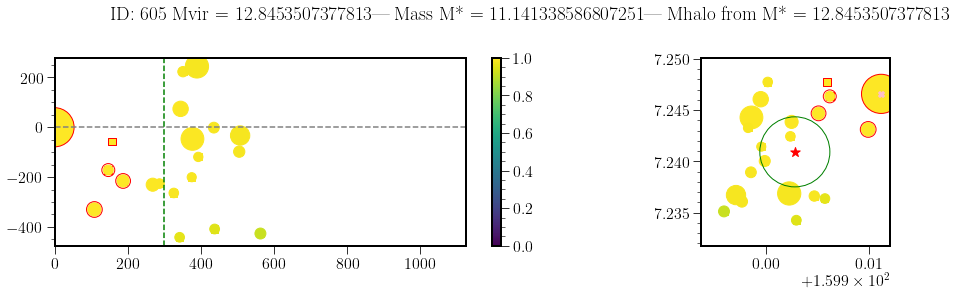

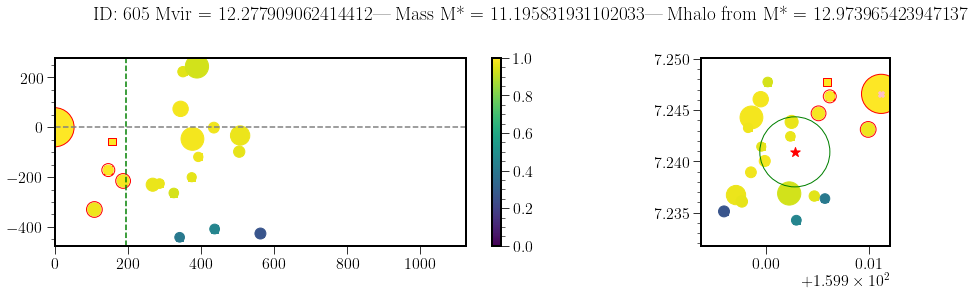

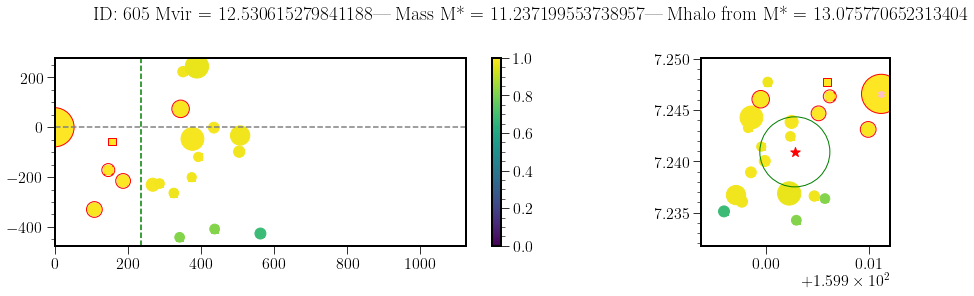

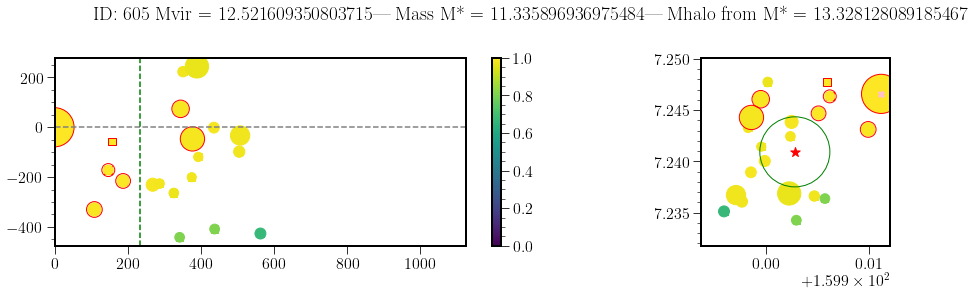

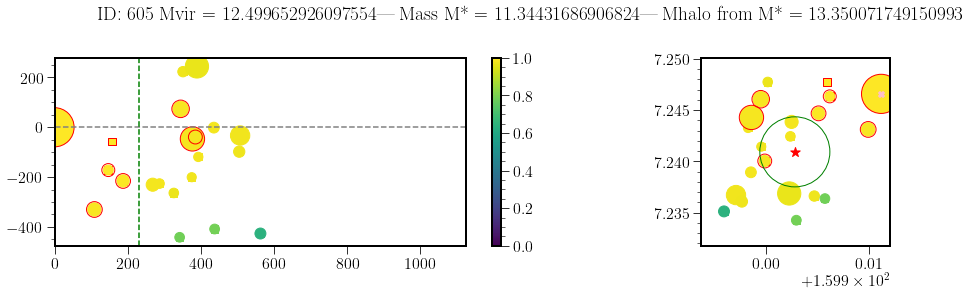

...

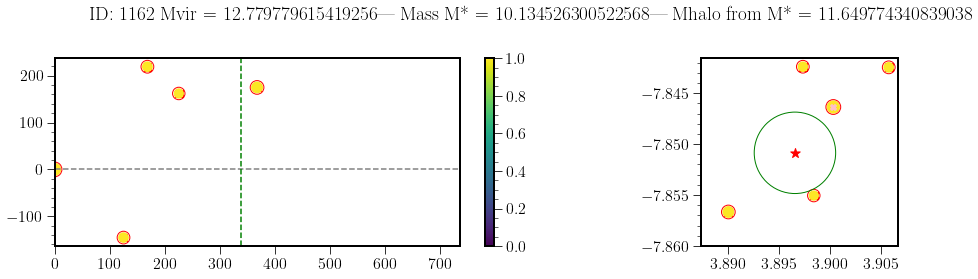

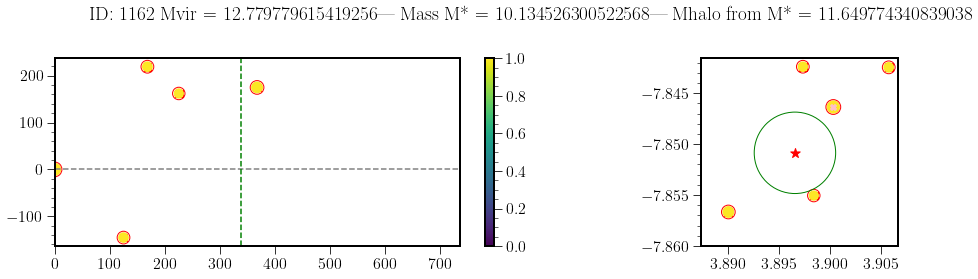

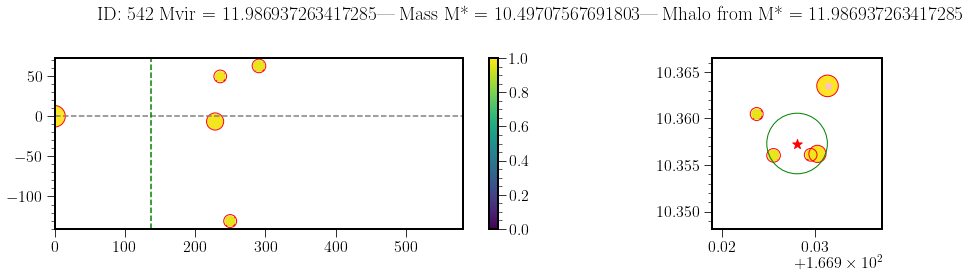

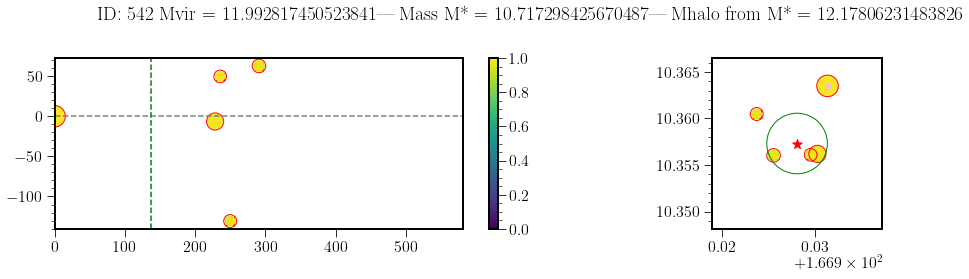

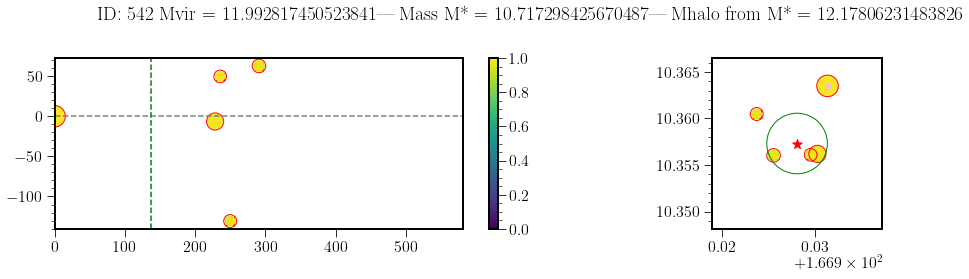

In [319]:
G_hom, R_hom = gid.hod_refinement_2(G_hom, R_hom)

In [79]:
#R_hom.to_csv("R_hom_raw_referee_modif.csv", index = False)
#G_hom.to_csv("G_hom_raw_referee_modif.csv", index = False)
R_hom = pd.read_csv("R_hom_raw_referee_modif.csv", index_col = False)
G_hom = pd.read_csv("G_hom_raw_referee_modif.csv", index_col = False)

In [80]:
print(len(R_hom))
print(len(G_hom))

2020
1362


In [81]:
G_hom = G_hom.sort_values(by="N_gal", ascending = False)
G_hom.head()

,field_id,group_id,N_gal,mean_z,mean_ra,mean_dec,b_min_kpc,Mvir_sigma2,Mvir_sigma3,Rvir_sigma2,...,Comments_qso,zqso_sdss,depth_qso,ebv_sfd_qso,ebv_sandf_qso,ebv_planck_qso,HST_qso,rmag_qso,ra_qso,dec_qso
1324,J1039p0714,605,21,0.987775,159.902073,7.241364,46.37,7.630926e+12,4.314044e+12,309.353476,...,NaN,1.532,24.5,0.0402,0.0346,0.049340,None,NaN,159.902785,7.240934
1325,J0145p1056,842,21,0.937542,26.304750,10.938249,1.28,1.542607e+13,2.944945e+13,400.005144,...,NaN,0.938,24.5,0.0677,0.0582,0.064520,None,NaN,26.304623,10.940742
1326,J0014m0028,1274,15,0.830293,3.719997,-0.477257,7.77,7.592986e+13,1.590934e+14,714.677895,...,NaN,1.927,25.0,0.0529,0.0455,0.061763,None,NaN,3.722351,-0.474349
1327,J1107p1021,544,14,0.744204,166.927825,10.357162,36.59,1.271548e+13,1.686994e+13,410.318396,...,NaN,1.925,24.5,0.0262,0.0225,0.031879,WFC3,17.6,166.928091,10.357311
1328,J0058p0111,1065,11,0.637824,14.733677,1.190410,6.06,1.369764e+13,1.447567e+13,443.107144,...,NaN,1.222,24.5,0.0253,0.0218,0.029647,None,NaN,14.732323,1.191270


Now we would like to reobtain the group catalog. The problem is that the "outlier" column is from the caustic method. And to obtain the group we need that outliers = the galaxies with a low Psat. Let's do that:

In [82]:
R_hom["outlier"] = R_hom["Psat"].apply(lambda x : not bool(np.round(x)))

In [83]:
R_hom[["Psat", "outlier"]]

,Psat,outlier
0,NaN,False
1,NaN,False
2,NaN,False
3,NaN,False
4,NaN,False
...,...,...
2015,1.000000,False
2016,0.981991,False
2017,0.979420,False
2018,0.968504,False


In [84]:
G_final = gid.get_groups(R_hom, N_min = 1)
G3_final = gid.get_groups(R_hom, N_min = 3)
G5_final = gid.get_groups(R_hom, N_min = 5)
len(G_final)

1362

In [85]:
G_final = gid.calc_mass_ratio(G_final, R_hom)
G_final = gid.recompute_centers_new(G_final, R_hom)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:228: RuntimeWarning: invalid value encountered in double_scalars
  center_ra = (r["mass10"] * r["RA"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:229: RuntimeWarning: invalid value encountered in double_scalars
  center_dec = (r["mass10"] * r["DEC"]).sum() / (r["mass10"].sum())
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:230: RuntimeWarning: invalid value encountered in double_scalars
  center_z = (r["mass10"] * r["Z"]).sum() / (r["mass10"].sum())


In [86]:
R_final, G_final = gid.calc_mass(R_hom, G_final, N_lim = 3)

/home/mcherrey/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0, 0.5, 'M from $\\sigma^3$ (Bryan+97)')

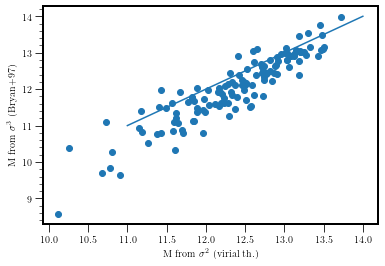

In [87]:
plt.scatter(np.log10(G_final["Mvir_sigma2"]), np.log10(G_final["Mvir_sigma3"]))
plt.plot([11,14],[11,14])
plt.xlabel("M from $\sigma^2$ (virial th.)")
plt.ylabel("M from $\sigma^3$ (Bryan+97)")

In [88]:
print("N of group of more than 3 galaxies: ", len(G3_final))
print("N of group of more than 5 galaxies: ", len(G5_final))

N of group of more than 3 galaxies:  129
N of group of more than 5 galaxies:  33


In [89]:
R_final = gid.match_qso(R_final, fields_info)

In [90]:
G_final = gid.create_id(G_final, "N_gal")

In [91]:
f1 = G_final["Mvir_sigma2"]>=1e12
f2 = G_final["Mvir_sigma2"]>=1e13
f3 = G_final["center_z"]>=0.3
f4 = G_final["center_z"]<=1.5
print("Number of groups with mass above 1e12 Msun: ", len(G_final[f1 & f3 & f4]))
print("Number of groups with mass above 1e13 Msun: ", len(G_final[f2 & f3 & f4]))

Number of groups with mass above 1e12 Msun:  72
Number of groups with mass above 1e13 Msun:  20


In [92]:
G_final.columns

Index(['index', 'field_id', 'group_id', 'N_gal', 'mean_z', 'mean_ra',
       'mean_dec', 'b_min_kpc', 'Mvir_sigma2', 'Mvir_sigma3', 'Rvir_sigma2',
       'Rvir_sigma3', 'Mstar', 'm1_m2_ratio', 'center_ra', 'center_dec',
       'center_z', 'center_ra_err', 'center_dec_err', 'center_z_err',
       'Mvir_sigma2_error', 'Rvir_sigma2_error', 'Mvir_sigma3_error',
       'Rvir_sigma3_error', 'Rmax', 'sigma_v', 'sigma_v_error', 'ID'],
      dtype='object')

In [93]:
G_final = gid.match_qso(G_final, fields_info)
len(G_final["group_id"])

1362

### N galaxies in xxx kpc

In [94]:
G_final = gid.get_Nxxx_all_groups(R_final, G_final, radius = 100)
G_final = gid.get_Nxxx_all_groups(R_final, G_final, radius = 200)

### Nb of galaxies around the LOS

In [95]:
N100 = []
dv = 1e6
for i, r in R_final.iterrows():
    f1 = np.abs(R_final["Z"] - r["Z"])*const.c.value/(1+r["Z"])<dv
    f2 = R_final["field_id"] == r["field_id"]
    f3 = R_final["B_KPC"]<100
    F = R_final[f1 & f2 & f3]
    N100.append(len(F))
R_final["N100_los"] = np.array(N100)

In [96]:
G_final = gid.get_N100_LOS(G_final, R_final, dv = 1e6)

### Nb of neighb for each galaxy

In [97]:
R_final = gid.get_Nxxx_neighb(R_final, radius = 100)
R_final = gid.get_Nxxx_neighb(R_final, radius = 50)

### Impact parameter relatively to the center of the groups

In [98]:
ra0 = G_final["center_ra"]*u.degree
ra1 = G_final["mean_ra"]*u.degree
ra2 = G_final["ra_qso"]*u.degree
dec0 = G_final["center_dec"]*u.degree
dec1 = G_final["mean_dec"]*u.degree
dec2 = G_final["dec_qso"]*u.degree
c0 = SkyCoord(ra0, dec0)
c1 = SkyCoord(ra1, dec1)
c2 = SkyCoord(ra2, dec2)
sep0 = c0.separation(c2)
sep1 = c1.separation(c2)
G_final["dist"] = Distance(unit=u.kpc, z = G_final["center_z"]).value/((1+G_final["center_z"])**2)
G_final["b_center_kpc"] = sep0.radian*G_final["dist"]
G_final["b_geomcenter_kpc"] = sep1.radian*G_final["dist"]
G_final = G_final.astype({"b_center_kpc":"float"})
G_final = G_final.astype({"b_geomcenter_kpc":"float"})

### Impact parameters normalized by Rvir:

In [99]:
G_final = gid.b_center_error(G_final)

In [100]:
G_final["b_min_kpc_norm2"] = G_final["b_min_kpc"]/G_final["Rvir_sigma2"] 
G_final["b_center_kpc_norm2"] = G_final["b_center_kpc"]/G_final["Rvir_sigma2"] 
G_final["b_geomcenter_kpc_norm2"] = G_final["b_geomcenter_kpc"]/G_final["Rvir_sigma2"]

G_final["b_min_kpc_norm2_err"] =  G_final["b_min_kpc_norm2"] * G_final["Rvir_sigma2_error"]/G_final["Rvir_sigma2"] 
G_final["b_center_kpc_norm2_err"] = G_final["b_center_err"]/G_final["Rvir_sigma2"] + G_final["b_center_kpc_norm2"] * G_final["Rvir_sigma2_error"]/G_final["Rvir_sigma2"] 
G_final["b_geomcenter_kpc_norm2_err"] = G_final["b_geomcenter_kpc_norm2"]* G_final["Rvir_sigma2_error"]/G_final["Rvir_sigma2"]

G_final["b_min_kpc_norm3"] = G_final["b_min_kpc"]/G_final["Rvir_sigma3"] 
G_final["b_center_kpc_norm3"] = G_final["b_center_kpc"]/G_final["Rvir_sigma3"] 
G_final["b_geomcenter_kpc_norm3"] = G_final["b_geomcenter_kpc"]/G_final["Rvir_sigma3"]

G_final["b_min_kpc_norm3_err"] = G_final["b_min_kpc_norm3"] * G_final["Rvir_sigma3_error"]/G_final["Rvir_sigma3"] 
G_final["b_center_kpc_norm3_err"] = G_final["b_center_err"]/G_final["Rvir_sigma2"] + G_final["b_center_kpc_norm3"] * G_final["Rvir_sigma3_error"]/G_final["Rvir_sigma3"] 
G_final["b_geomcenter_kpc_norm3_err"] = G_final["b_geomcenter_kpc_norm3"]* G_final["Rvir_sigma3_error"]/G_final["Rvir_sigma3"]


### check if QSO is behind the groups

In [101]:
G_final["QSO_is_behind"] = G_final["mean_z"] <= G_final["zqso_sdss"] - 3e6/const.c.value

In [102]:
len(G_final[G_final["QSO_is_behind"] == True])

709

### Detection limit

In [103]:
R_final["detection_limit"] = 0.1/(1+R_final["Z"])
G_final["detection_limit"] = 0.1/(1+G_final["center_z"])

### absorption & emission expected lamba

In [104]:
G_final["lambda_oii_a"] = oii_a*(1+G_final["mean_z"])
G_final["lambda_oii_b"] = oii_b*(1+G_final["mean_z"])
G_final["lambda_mgii_a"] = mgii_a*(1+G_final["mean_z"])
G_final["lambda_mgii_b"] = mgii_b*(1+G_final["mean_z"])


R_final["lambda_oii_a"] = oii_a*(1+R_final["Z"])
R_final["lambda_oii_b"] = oii_b*(1+R_final["Z"])
R_final["lambda_mgii_a"] = mgii_a*(1+R_final["Z"])
R_final["lambda_mgii_b"] = mgii_b*(1+R_final["Z"])

### Match with absorptions:

In [157]:
Abs = gid.get_N100_abs(Abs, R_final, dv = 0.5e6)
Abs2 = gid.get_Nxxx_abs(Abs, R_final, bmax = 2000, dv = 0.5e6)
Abs3 = gid.get_Nxxx_abs_test(Abs, R_final, bmax = 100, dv = 0.5e6)
Abs4 = gid.get_Nxxx_abs_test(Abs, R_final, bmax = 2000, dv = 0.5e6)
Abs5 = gid.get_Nxxx_abs(Abs, R_final, bmax = 250, dv = 0.5e6)

In [158]:
#f1 = Abs2["z_abs"] < z_oii_a_muse_max
#f2 = Abs2["z_abs"] > z_oii_a_muse_min

f1 = Abs2["z_abs"] < 1.45
f2 = Abs2["z_abs"] > 0.35

Abs2_selec = Abs2[f1 & f2]

In [128]:
print(z_oii_a_muse_max, z_oii_a_muse_min)

1.4959474401777757 0.2882309368659488


N100_mean:  1.2413793103448276


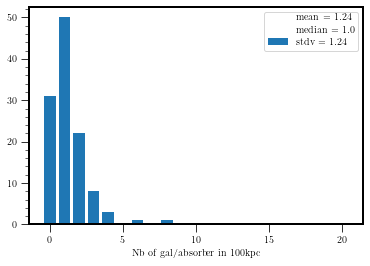

In [129]:
mean = np.mean(Abs2_selec["N100_abs"])
med = np.median(Abs2_selec["N100_abs"])
stdv = np.std(Abs2_selec["N100_abs"])
label = "mean = " + str(np.round(mean,2)) +\
        "\n median = "+ str(np.round(med,2)) +\
        "\n stdv = "+ str(np.round(stdv,2))
plt.hist(Abs2_selec["N100_abs"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label);
plt.xlabel("Nb of gal/absorber in 100kpc")
plt.legend()
print("N100_mean: ",np.mean(Abs2_selec["N100_abs"]))

Text(0.5, 0, 'Nb of galaxies/absorption')

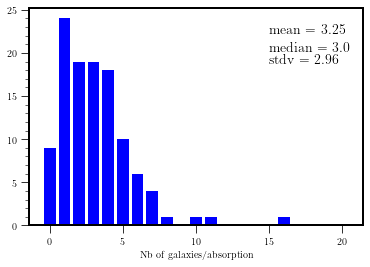

In [159]:
mean = np.mean(Abs2_selec["N2000_abs"])
med = np.median(Abs2_selec["N2000_abs"])
stdv = np.std(Abs2_selec["N2000_abs"])
label = "\n mean = " + str(np.round(mean,2)) +\
        "\n median = "+ str(np.round(med,2)) +\
        "\n stdv = "+ str(np.round(stdv,2))+" "
plt.hist(Abs2_selec["N2000_abs"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label, color = "blue");

plt.text(15, 23, label, fontsize=14, verticalalignment='top')


plt.xlabel("Nb of galaxies/absorption")
#plt.legend()

We want to reproduce the plot from Nicolas in the survey paper:

In [143]:
Abs05 = Abs2[Abs2["REW_2796"]>=0.5]
Abs05 = Abs05[Abs05["z_abs"]<1.45]
Abs05 = Abs05[Abs05["z_abs"]>=0.35]

(0.0, 40.0)

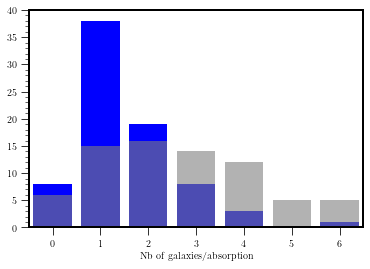

In [140]:
mean = np.mean(Abs05["N100_abs"])
med = np.median(Abs05["N100_abs"])
stdv = np.std(Abs05["N100_abs"])
label = "\n mean = " + str(np.round(mean,2)) +\
        "\n median = "+ str(np.round(med,2)) +\
        "\n stdv = "+ str(np.round(stdv,2))+" "
plt.hist(Abs05["N100_abs"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label, color = "blue");
plt.hist(Abs05["N250_abs"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label, color = "grey", alpha = 0.6);


#plt.text(15, 23, label, fontsize=14, verticalalignment='top')


plt.xlabel("Nb of galaxies/absorption")
plt.xlim((-0.5, 6.5))
plt.ylim((0,40))
#plt.legend()

(0.0, 18.0)

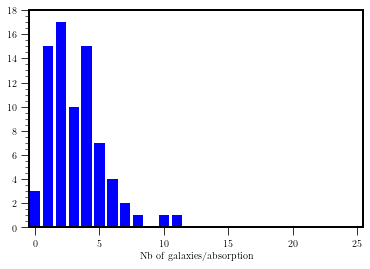

In [145]:
plt.hist(Abs05["N2000_abs"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, color = "blue");
plt.xlabel("Nb of galaxies/absorption")
plt.xlim((-0.5, 25.5))
plt.ylim((0,18))
#plt.legend()

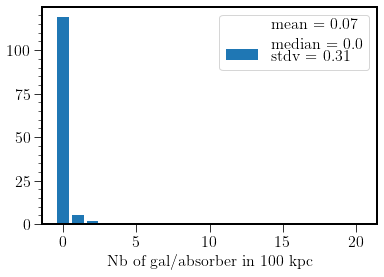

In [353]:
mean = np.mean(Abs["N100_abs_random"])
med = np.median(Abs["N100_abs_random"])
stdv = np.std(Abs["N100_abs_random"])
label = "mean = " + str(np.round(mean,2)) +\
        "\n median = "+ str(np.round(med,2)) +\
        "\n stdv = "+ str(np.round(stdv,2))
plt.hist(Abs3["N100_abs_random"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label);
plt.xlabel("Nb of gal/absorber in 100 kpc")
plt.legend()

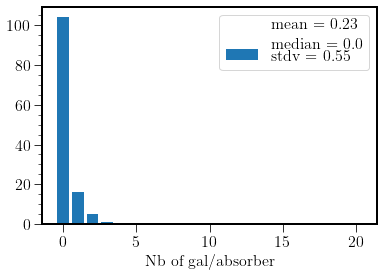

In [354]:
mean = np.mean(Abs["N2000_abs_random"])
med = np.median(Abs["N2000_abs_random"])
stdv = np.std(Abs["N2000_abs_random"])
label = "mean = " + str(np.round(mean,2)) +\
        "\n median = "+ str(np.round(med,2)) +\
        "\n stdv = "+ str(np.round(stdv,2))
plt.hist(Abs4["N2000_abs_random"], range = (-0.5,20.5), bins = 21, rwidth = 0.8, label = label);
plt.xlabel("Nb of gal/absorber")
plt.legend()

In [355]:
G_final = gid.match_absorptions(G_final, Abs, dv = 1e6)
R_final = gid.match_absorptions_isolated_galaxies(R_final, Abs, dv = 0.5e6)

### Filtering UVES coverage

In [356]:
cov_table = pd.read_csv("group_abs_coverage_table.csv")

In [357]:
dz = 0.5e6/const.c.value
grp_id = []
for i, c in cov_table.iterrows():
    f = c["field_id"]
    z = c["mean_z"]
    k1 = G_final["field_id"] == f
    k2 = G_final["mean_z"].between(z-dz, z+dz)
    match = G_final[k1 & k2]
    if len(match) == 1:
        grp_id.append(float(match["group_id"].values))
    else:
        grp_id.append(-1)
    #print(len(match))
cov_table["group_id"] = np.array(grp_id)

In [358]:
cov_table_trunc = cov_table[["group_id","FeII_2374_lim", "FeII_2600_lim", "MgII_2796_lim", "MgII_2803_lim", "MgI_2852_lim"]]

In [359]:
cov_table_trunc.drop_duplicates(subset ="group_id",keep = False, inplace = True)

In [360]:
G_final = G_final.merge(cov_table_trunc, on = "group_id", how = "left")

# Errors estimation

There are several sources of uncertainties to take into account.

The error bars for MgII EW are quite small.
The error bars for Mvir and Rvir are much more important.

Several things must be taken into account:
1. Rvir is computed from $\sigma^2$ or $\sigma^3$. The error on sigma comes from the sampling. The more we have galaxies, the better is the sampling. Assuming that velocities are normally distributed, the 1-σ uncertainty on $\sigma$ for a group of n galaxies is the standard error on the standard deviation on velocities and is equal to: $\sigma_{los} \sqrt{1 − c_4^2(n)}$ where $c_4(n) \approx 1-1/4n - 7/32n^2 - 19/128n^3$. For this component there is no bias.
2. Rvir is also computed from the visually estimated radius. This estimation is wrong because the FOV could crop the group. If we note L the half of the size of the FOV (here 30 arcsec), and if we consider a group of real radius R, there is an underestimation in $(2L)^2 - (2(L-R))^2$ cases upon a total of $(2L)^2$ cases. And the average underestimation is (if we except the case of the corners) $\approx \frac{R^2(2L-R)}{L^2}$. Of course it would be possible to refine this number for each group by considering the distance between its center and the LOS. For this source of error we have a bias toward lower values (it tends to underestimate Rvir)
3. The less galaxies we have in a group, the more we underestimate the radius of the group. This uncertainty can be estimated by a MC method (see in the dedicated notebook)
4. We consider the heaviest galaxy as the center of the group. What if it is not the case? Very difficult to estimate.... Could measure on TNG the distance between the central galaxy and DM halo center..

Maybe points 3 and 4 could be merged and resolved if we use the spatial dispersion to estimate the radius of the group.

In [361]:
print("N of group of more than 3 galaxies: ", len(G3_final))
print("N of group of more than 5 galaxies: ", len(G5_final))

N of group of more than 3 galaxies:  129
N of group of more than 5 galaxies:  33


In [392]:
f1 = G_final["Mvir_sigma2"]>=1e12
f2 = G_final["Mvir_sigma2"]>=1e13
f3 = G_final["mean_z"]>=0.3
f4 = G_final["mean_z"]<=1.5
f5 = G_final["N_gal"]>=5
print("Number of groups with mass above 1e12 Msun: ", len(G_final[f1 & f3 & f4]))
print("Number of groups with mass above 1e13 Msun: ", len(G_final[f2 & f3 & f4 & f5]))

Number of groups with mass above 1e12 Msun:  72
Number of groups with mass above 1e13 Msun:  6


In [362]:
G = G_final.copy()
R = R_final.copy()

f5 = G["N_gal"] == 1
f6 = G["N_gal"]  > 1
f7 = G["N100_los"] > 1
f8 = G["bool_absorption"] == 1
f9 = G["N_gal"] >= 5
f99 = G["N_gal"] >= 3
f10 = G["bool_absorption"] == 0
f11 = G["N_gal"] >= 2
f12 = G["MgII_2796_lim"] == np.inf
f13 = G["MgII_2796_lim"] != np.inf
f14 = G["QSO_is_behind"] == True
#f24 = G["ID"].isin(good_grp)

f15 = R["B_KPC"] <= 100
f16 = R["N100_los"] <= 2
f17 = R["N100_los"] <= 1
f18 = R["N50_neighb"] == 0
f19 = R["Z"] >= 4700/2796 - 1
f20 = R["Z"] <= 9300/2796 - 1
f21 = R["bool_absorption"] == 0
f22 = R["bool_absorption"] == 1
f23 = R["B_KPC"]>= 5 # remove the QSOs
#fweirds = G["Rvir_recomputed"] >= 10

In [363]:
G_abs = G[f8 & f14 & f13]
G_noabs = G[f10 & f14 & f13]
G2 = G[f7 & f13 & f14]
G2_abs = G[f8 & f7 & f14 & f13]
G2_noabs = G[f10 & f7 & f14 & f13]
G5 = G[f9 & f13 & f14]
#G5 = gid.create_id(G5, "N_gal")
G5_abs = G5[G5["bool_absorption"] == 1]
G5_noabs = G5[G5["bool_absorption"] == 0]
G3 = G[f99 & f13 & f14]
G3_abs = G3[G3["bool_absorption"] == 1]
G3_noabs = G3[G3["bool_absorption"] == 0]

R_ilane_abs = R[f22 & f15 & f17 & f18 & f23]
R_ilane_noabs = R[f21 & f15 & f17 & f18  & f23]
R_ilane2_abs = R[f22 & f17 & f18  & f23]
R_ilane2_noabs = R[f21 & f17 & f18  & f23]

In [406]:
ttt = G[f9 & ~f14]
ttt[["center_z", "zqso_sdss"]]

,center_z,zqso_sdss
1,0.93780,0.938
9,1.47930,1.484
10,0.87306,0.875
30,3.54902,1.925


In [364]:
print("nb of groups of more than 3 gal: ", len(G3))
print("nb of groups of more than 5 gal: ", len(G5))

nb of groups of more than 3 gal:  93
nb of groups of more than 5 gal:  26


# Some plots about our group sample

(10.0, 15.0)

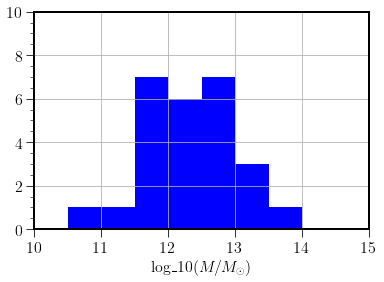

In [365]:
plt.hist(np.log10(G5["Mvir_sigma2"]), bins = 9, range = (10,14.5), color = 'blue');
plt.xlabel("log_{10}($M/M_{\odot}$)")
plt.grid()
plt.ylim((0,10))
plt.xlim((10,15))

In [409]:
print("min mass = ", np.min(np.log10(G5["Mvir_sigma2"])), "max mass = ", np.max(np.log10(G5["Mvir_sigma2"])))

min mass =  10.726187183000865 max mass =  13.719026815640284


In [419]:
print("median mass = ", np.median(np.log10(G5["Mvir_sigma2"])))

median mass =  12.346054727074716


In [421]:
print("median z = ", np.median(G5["center_z"]))

median z =  0.95621


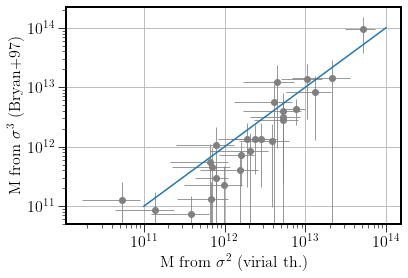

In [366]:
plt.errorbar(G5["Mvir_sigma2"], G5["Mvir_sigma3"], xerr = G5["Mvir_sigma2_error"], yerr = G5["Mvir_sigma3_error"],\
            fmt = 'o', c = "gray", linewidth = 0.8)
plt.plot([1e11,1e14],[1e11,1e14])
plt.xlabel("M from $\sigma^2$ (virial th.)")
plt.ylabel("M from $\sigma^3$ (Bryan+97)")
plt.xscale("log")
plt.yscale("log")
plt.grid()

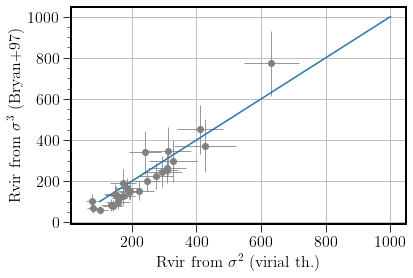

In [367]:
plt.errorbar(G5["Rvir_sigma2"], G5["Rvir_sigma3"], xerr = G5["Rvir_sigma2_error"], yerr = G5["Rvir_sigma3_error"],\
            fmt = 'o', c = "gray", linewidth = 0.8)
plt.plot([100,1000],[100,1000])
plt.xlabel("Rvir from $\sigma^2$ (virial th.)")
plt.ylabel("Rvir from $\sigma^3$ (Bryan+97)")
plt.grid()

In [368]:
G5_noabs["b_center_kpc_norm2_err"]

4     0.213089
8     0.306619
22    0.173621
29    0.534374
31    0.151509
Name: b_center_kpc_norm2_err, dtype: float64

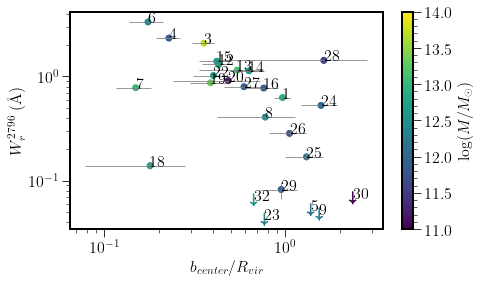

In [410]:
plt.figure(figsize = (7,4))
#plt.title("FoF groups ($N >= 5$)")
plt.errorbar(G5_abs["b_center_kpc_norm2"], G5_abs["REW_2796"], xerr = G5_abs["b_center_kpc_norm2_err"], yerr = G5_abs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G5_abs["b_center_kpc_norm2"], G5_abs["REW_2796"], marker = "o", label = "groups N >= 5", \
            c = np.log10(G5_abs["Mvir_sigma2"]), vmin = 11, vmax = 14)
plt.colorbar(label = "log($M/M_{\odot}$)")
plt.errorbar(G5_noabs["b_center_kpc_norm2"], G5_noabs["REW_2796"], xerr = G5_noabs["b_center_kpc_norm2_err"], yerr = G5_noabs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G5_noabs["b_center_kpc_norm2"], G5_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c = np.log10(G5_noabs["Mvir_sigma2"]),vmin = 11, vmax = 14)

X = np.array(G5_abs["b_center_kpc_norm2"])
Y = np.array(G5_abs["REW_2796"])
txt = np.array(G5_abs["ID"])

for i in range(len(G5_abs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))
    
X = np.array(G5_noabs["b_center_kpc_norm2"])
Y = np.array(G5_noabs["detection_limit"])
txt = np.array(G5_noabs["ID"])

for i in range(len(G5_noabs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))


plt.xlabel("$b_{center}/R_{vir}$")
plt.ylabel("$W_r^{2796}$ (\AA)")
#plt.grid()
plt.xscale("log")
plt.yscale("log")
#plt.xlim((0.1,5))

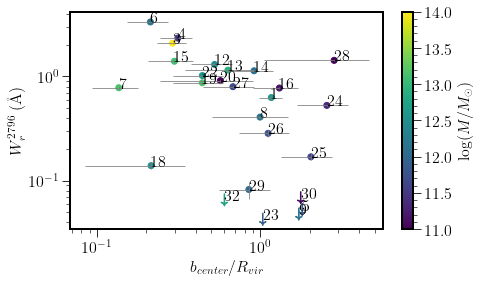

In [411]:
plt.figure(figsize = (7,4))
#plt.title("FoF groups ($N >= 5$)")
plt.errorbar(G5_abs["b_center_kpc_norm3"], G5_abs["REW_2796"], xerr = G5_abs["b_center_kpc_norm3_err"], yerr = G5_abs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G5_abs["b_center_kpc_norm3"], G5_abs["REW_2796"], marker = "o", label = "groups N >= 5", \
            c = np.log10(G5_abs["Mvir_sigma3"]), vmin = 11, vmax = 14)
plt.colorbar(label = "log($M/M_{\odot}$)")
plt.errorbar(G5_noabs["b_center_kpc_norm3"], G5_noabs["REW_2796"], xerr = G5_noabs["b_center_kpc_norm3_err"], yerr = G5_noabs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G5_noabs["b_center_kpc_norm3"], G5_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c = np.log10(G5_noabs["Mvir_sigma3"]),vmin = 11, vmax = 14)

X = np.array(G5_abs["b_center_kpc_norm3"])
Y = np.array(G5_abs["REW_2796"])
txt = np.array(G5_abs["ID"])

for i in range(len(G5_abs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))
    
X = np.array(G5_noabs["b_center_kpc_norm3"])
Y = np.array(G5_noabs["detection_limit"])
txt = np.array(G5_noabs["ID"])

for i in range(len(G5_noabs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))


plt.xlabel("$b_{center}/R_{vir}$")
plt.ylabel("$W_r^{2796}$ (\AA)")
#plt.grid()
plt.xscale("log")
plt.yscale("log")
#plt.xlim((0.1,5))

In [412]:
# the ids of the groups are:
id_list = G5["group_id"].to_list()
R5 = R[R["group_id"].isin(id_list)]
len(R5)

195

In [413]:
len(R5[R5["outlier"] == False])

184

# Exports

In [414]:
R_final.to_csv("R_referee_modif.csv", index = False)
G_final.to_csv("G_referee_modif.csv", index = False)

In [418]:
fields_info["zqso_sdss"]<1.5

0     False
1     False
2      True
3      True
4     False
5     False
6     False
7      True
8      True
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17     True
18    False
19    False
20    False
21    False
Name: zqso_sdss, dtype: bool

In [ ]:
#G5["m1_m2_ratio"] >= 1.5

In [ ]:
def calc_mass_ratio(G, R):
    G["m1_m2_ratio"] = -1
    for i, g in G.iterrows():
        r = R[R["group_id"] == g["group_id"]]
        r = r.sort_values(by="mass10", ascending = False)
        r = r[r["mass"].isna() == False]
        #print(r["mass"])
        if len(r) >= 2:
            r0 = r[:1]
            r1 = r[1:2]
            r0 = r0.squeeze()
            r1 = r1.squeeze()
            ratio = (10**r0["mass"])/(10**r1["mass"])
            #print("----------------------- RATIO = ", ratio)
            plt.figure()
            plt.suptitle("RATIO = " +str(np.round(ratio,3)))
            plt.scatter([1,2], [r0["mass10"], r1["mass10"]])
            plt.vlines([1,2], [10**r0["mass_l68"], 10**r1["mass_l68"]],[10**r0["mass_u68"],10**r1["mass_u68"]],\
                       color ="gray", linewidth = 0.8)
            plt.xlim((0,3))
            #plt.ylim((1e9,5e11))
            plt.yscale("log")
    return

In [ ]:
gid.plot_groups_2(R, G5)

In [ ]:
G5.columns

for i, g in G5.iterrows():
    ra_c = g["center_ra"]* u.degree
    dec_c = g["center_dec"]*u.degree
    ra_c_err = (g["center_ra"] + g["center_ra_err"])*u.degree
    dec_c_err = (g["center_dec"] + g["center_dec_err"])*u.degree
    
    ra_qso = g["ra_qso"]* u.degree
    dec_qso = g["dec_qso"]*u.degree
    c1 = SkyCoord(ra_c, dec_c)
    c2 = SkyCoord(ra_qso, dec_c)
    c3 = SkyCoord(ra_c, dec_qso)
    c4 = SkyCoord(ra_c_err, dec_c)
    c5 = SkyCoord(ra_c, dec_c_err)
    
    ra_sep = c1.separation(c2)
    dec_sep = c1.separation(c3)
    ra_err_sep = c1.separation(c4)
    dec_err_sep = c1.separation(c5)
    ra_dist = ra_sep.radian*Distance(unit=u.kpc, z=g["center_z"]).value / ((1 + g["center_z"]) ** 2)
    dec_dist = dec_sep.radian*Distance(unit=u.kpc, z=g["center_z"]).value / ((1 + g["center_z"]) ** 2)
    ra_err_dist = ra_err_sep.radian*Distance(unit=u.kpc, z=g["center_z"]).value / ((1 + g["center_z"]) ** 2)
    dec_err_dist = dec_err_sep.radian*Distance(unit=u.kpc, z=g["center_z"]).value / ((1 + g["center_z"]) ** 2)
    #df["r_to_gcenter"] = sep.radian * Distance(unit=u.kpc, z=z_center).value / ((1 + z_center) ** 2)
    #print("dist =", ra_dist, dec_dist)
    b_kpc = (ra_dist**2 + dec_dist**2)**0.5 
    
    #print(b_kpc, g["b_center_kpc"])
    #print("errors = ", ra_err_dist, dec_err_dist)
    b_ra_err = ra_dist*ra_err_dist/b_kpc
    b_dec_err = dec_dist*dec_err_dist/b_kpc
    
    b_err = b_ra_err + b_dec_err
    
    print("b error = ", b_err, " -----ra_contribution = ", b_ra_err, "---dec_contribution = ", b_dec_err)
    print("------------------------------------------ra_err = ", ra_err_dist, "------------dec_err = ", dec_err_dist)

#### 

In [ ]:
51.51 - 6.75 - 3.10 - 2.99 - 2.14 - 4.75 - 0.37

In [ ]:
10**2.12

In [184]:
nowhite = R[R["WHITE_ID"].isna()]
no_white_bright = nowhite[nowhite["SDSS_r"]<22]

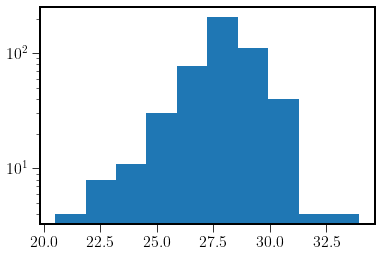

In [183]:
plt.hist(nowhite["SDSS_r"]);
plt.yscale("log")

In [185]:
no_white_bright

,ID,field_id,DATASET,FROM,Z,ZCONF,is_QSO,is_star,DR1_id,DR1_nbmatch,...,lambda_oii_a,lambda_oii_b,lambda_mgii_a,lambda_mgii_b,REW_2796,sig_REW_2796,z_absorption,z_absorption_dist,vel_absorption_dist,bool_absorption
245,29002,J1425p1209,b'psfsub',b'FELINE',0.59678,3,0,0,b'157',b'1',...,5949.666151,5954.073264,4463.843200,4475.301693,1.448,0.029,0.59677,0,1877.481294,1
549,25095,J1236p0725,b'psfsub',b'MANUAL',0.91200,2,0,0,b'52',b'2',...,7124.188480,7129.465600,5345.049536,5358.770048,2.126,0.026,0.91233,0,51742.422144,1
1039,19002,J0800p1849,b'psfsub',b'FELINE',0.78090,3,0,0,NaN,NaN,...,6635.704636,6640.619920,4978.555815,4991.335554,0.000,0.000,0.00000,0,0.000000,0
1948,19105,J0800p1849,b'psfsub',b'MANUAL',0.60800,2,0,0,b'23',b'1',...,5991.472320,5995.910400,4495.209024,4506.748032,1.020,0.013,0.60771,0,54067.047774,1


In [187]:
df[df["DR1_id"] == 91]

,ID,field_id,DATASET,FROM,Z,ZCONF,is_QSO,is_star,DR1_id,DR1_nbmatch,...,photoz_zbest_u95,photoz_rchisq,primary,mass_noNA,mass,dist_ang,dist_lum,N100_neighb,N50_neighb,group_id
